# MARCEL JONES RAYMOND

## DOMAIN: Automobile

### CONTEXT: The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributeS

### PROJECT OBJECTIVE: Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’
Steps and tasks: [ Total Score: 25 points]
1. Import and warehouse data: [ Score: 3 points ]
    • Import all the given datasets and explore shape and size.
    • Merge all datasets onto one and explore final shape and size.
    • Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.
    • Import the data from above steps into python.
2. Data cleansing: [ Score: 3 points ]
    • Missing/incorrect value treatment
    • Drop attribute/s if required using relevant functional knowledge
    • Perform another kind of corrections/treatment on the data.
3. Data analysis & visualisation: [ Score: 4 points ]
    • Perform detailed statistical analysis on the data.
    • Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.
    Hint: Use your best analytical approach. Even you can mix match columns to create new columns which can be used for better analysis. Create
    your own features if required. Be highly experimental and analytical here to find hidden patterns.
4. Machine learning: [ Score: 8 points ]
    • Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.
    • Share your insights about the difference in using these two methods.
5. Answer below questions based on outcomes of using ML based methods. [ Score: 5 points ]
    • Mention how many optimal clusters are present in the data and what could be the possible reason behind it.
    • Use linear regression model on different clusters separately and print the coefficients of the models individually
    • How using different models for different clusters will be helpful in this case and how it will be different than using one single model without
    clustering? Mention how it impacts performance and prediction.
6. Improvisation: [ Score: 2 points ]
    • Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to
    perform a better data analysis in future.

### Import and warehouse data:

In [1]:
# importing the basic mathematical packages and other supporting packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style
sns.set(rc={'figure.figsize':(15,10)})
style.use('fivethirtyeight')

# importing statistical libraries
from scipy.stats import f_oneway,ttest_ind,chi2,chi2_contingency
from statsmodels.stats import anova
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.formula.api import ols
import statsmodels.api as sm
from scipy.spatial.distance import pdist
#  preprocessing packages
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler,MinMaxScaler,LabelEncoder
from scipy.stats import zscore
from scipy.stats import shapiro
from sklearn.model_selection import train_test_split,GridSearchCV,cross_validate,cross_val_score,KFold,StratifiedKFold

# handeling data imbalance
from imblearn.over_sampling import SMOTE,SMOTENC

# models 
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR,SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor,AdaBoostRegressor,GradientBoostingRegressor,RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.cluster import KMeans,AgglomerativeClustering
import scipy.stats as stats
from sklearn import metrics
from sklearn import svm

# model for feature extraction
from sklearn.decomposition import PCA

# dendrogram
from scipy.cluster.hierarchy import cophenet,linkage,dendrogram

# metrics
from sklearn.metrics import silhouette_score,r2_score,accuracy_score

# visualization package:
import plotly as py
import cufflinks as cf
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

# mute warnings
import warnings 
warnings.filterwarnings('ignore')

# display options
pd.options.display.max_rows=10000
pd.options.display.max_columns=10000

In [2]:
df1=pd.read_csv('Part1 - Car name.csv')
print('Shape of the first dataframe: ',df1.shape)
print('Size of the second dataframe: ',df1.size)

Shape of the first dataframe:  (398, 1)
Size of the second dataframe:  398


In [3]:
df2=pd.read_json('Part1 - Car-Attributes.json')
print('Shape of the second dataframe: ',df2.shape)
print('Size of the second dataframe: ',df2.size)

Shape of the second dataframe:  (398, 8)
Size of the second dataframe:  3184


In [4]:
data=pd.concat([df1,df2],axis=1)

In [5]:
print('Shape of the final dataset: ',data.shape)
print('Size of the final dataset: ',data.size)

Shape of the final dataset:  (398, 9)
Size of the final dataset:  3582


In [6]:
data.to_csv('Automobile.csv',index=False)
data.to_excel('Automobile.xlsx',index=False)
data.to_json('Automobile.json')

In [7]:
new_data=pd.read_csv('Automobile.csv')

In [8]:
data=new_data.copy()

### Data cleansing:

In [9]:
data.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [10]:
data.tail()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1
397,chevy s-10,31.0,4,119.0,82,2720,19.4,82,1


In [11]:
data.sample(10)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
192,chevrolet nova,22.0,6,250.0,105,3353,14.5,76,1
357,datsun 200sx,32.9,4,119.0,100,2615,14.8,81,3
299,peugeot 504,27.2,4,141.0,71,3190,24.8,79,2
305,buick skylark limited,28.4,4,151.0,90,2670,16.0,79,1
91,chevrolet caprice classic,13.0,8,400.0,150,4464,12.0,73,1
76,volvo 145e (sw),18.0,4,121.0,112,2933,14.5,72,2
231,chrysler cordoba,15.5,8,400.0,190,4325,12.2,77,1
29,datsun pl510,27.0,4,97.0,88,2130,14.5,71,3
194,amc hornet,22.5,6,232.0,90,3085,17.6,76,1


In [12]:
data.isna().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


In [14]:
data[data['hp']=="?"]

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
32,ford pinto,25.0,4,98.0,?,2046,19.0,71,1
126,ford maverick,21.0,6,200.0,?,2875,17.0,74,1
330,renault lecar deluxe,40.9,4,85.0,?,1835,17.3,80,2
336,ford mustang cobra,23.6,4,140.0,?,2905,14.3,80,1
354,renault 18i,34.5,4,100.0,?,2320,15.8,81,2
374,amc concord dl,23.0,4,151.0,?,3035,20.5,82,1


In [15]:
data['hp']=pd.to_numeric(data['hp'],errors='coerce')

In [16]:
data.isna().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [17]:
data['hp']=data['hp'].replace(np.nan,data['hp'].median())

In [18]:
data=data.drop('car_name',1)

In [19]:
data.corr().style.background_gradient('magma')

,mpg,cyl,disp,hp,wt,acc,yr,origin
mpg,1.000000,-0.775396,-0.804203,-0.773453,-0.831741,0.420289,0.579267,0.563450
cyl,-0.775396,1.000000,0.950721,0.841284,0.896017,-0.505419,-0.348746,-0.562543
disp,-0.804203,0.950721,1.000000,0.895778,0.932824,-0.543684,-0.370164,-0.609409
hp,-0.773453,0.841284,0.895778,1.000000,0.862442,-0.686590,-0.413733,-0.452096
wt,-0.831741,0.896017,0.932824,0.862442,1.000000,-0.417457,-0.306564,-0.581024
acc,0.420289,-0.505419,-0.543684,-0.686590,-0.417457,1.000000,0.288137,0.205873
yr,0.579267,-0.348746,-0.370164,-0.413733,-0.306564,0.288137,1.000000,0.180662
origin,0.563450,-0.562543,-0.609409,-0.452096,-0.581024,0.205873,0.180662,1.000000


### Data analysis & visualisation:

In [20]:
data.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
hp,398.0,104.304020,38.222625,46.0,76.000,93.5,125.000,230.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


#### Origin of the car can be converted into their continent

In [21]:
data['origin']=data['origin'].replace({1:'ASIA',2:'AMERICA',3:'EUROPE'})

In [22]:
data['cyl']=data['cyl'].replace({4:'inline-Four_Engine',8:'V8_Engine',5:'inline-Five_Engine',6:'V6_Engine',3:'inline-Triple'})

In [23]:
data.rename(columns={"cyl": "Engine"},inplace=True)

In [24]:
val=data['yr'].value_counts().index
new_vals=val+1900
data['yr']=data['yr'].replace(val,new_vals)

<AxesSubplot:>

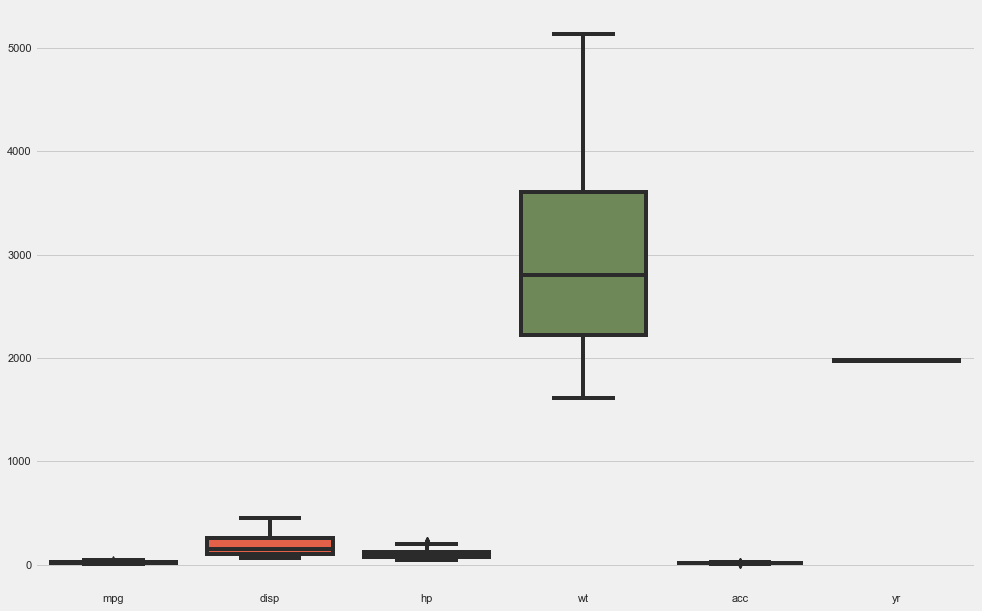

In [25]:
sns.boxplot(data=data)

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   Engine  398 non-null    object 
 2   disp    398 non-null    float64
 3   hp      398 non-null    float64
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    object 
dtypes: float64(4), int64(2), object(2)
memory usage: 25.0+ KB


In [27]:
cat=data.select_dtypes(include='object').columns
data['yr']=data['yr'].astype('category')
data[cat]=data[cat].astype('category')
num_cols=data.select_dtypes(exclude='category').columns
cat_cols=data.select_dtypes(include='category').columns

### Numerical Column_viz

In [28]:
num_cols

Index(['mpg', 'disp', 'hp', 'wt', 'acc'], dtype='object')

##### Normality test

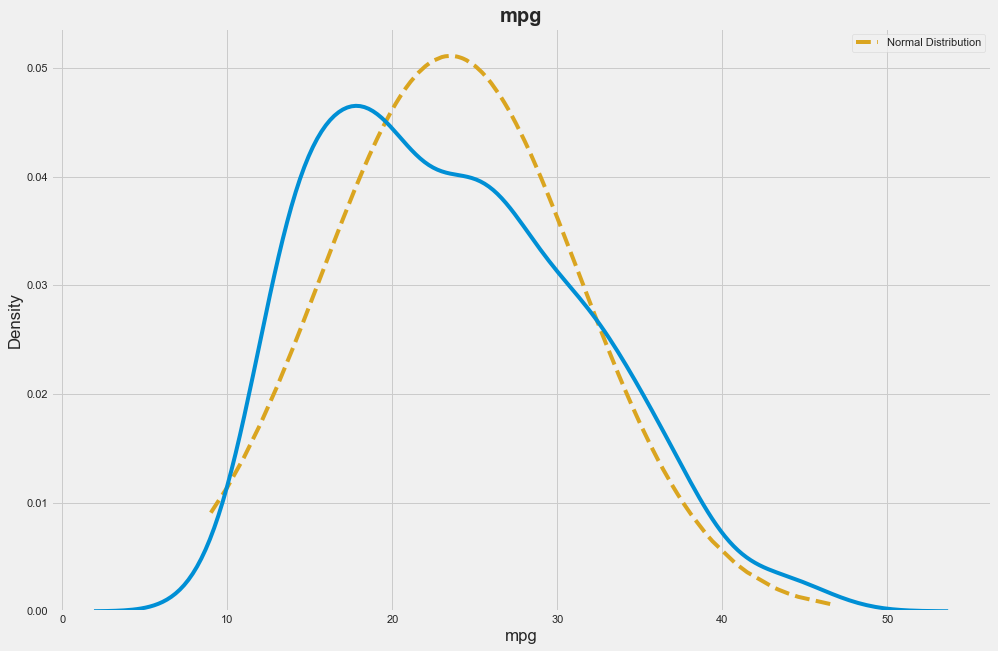

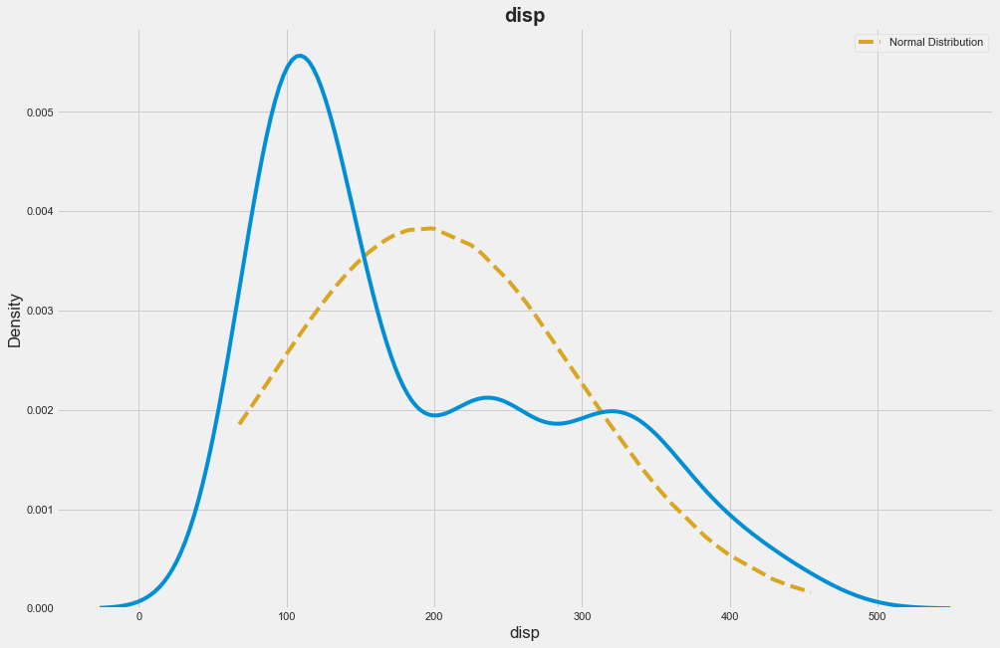

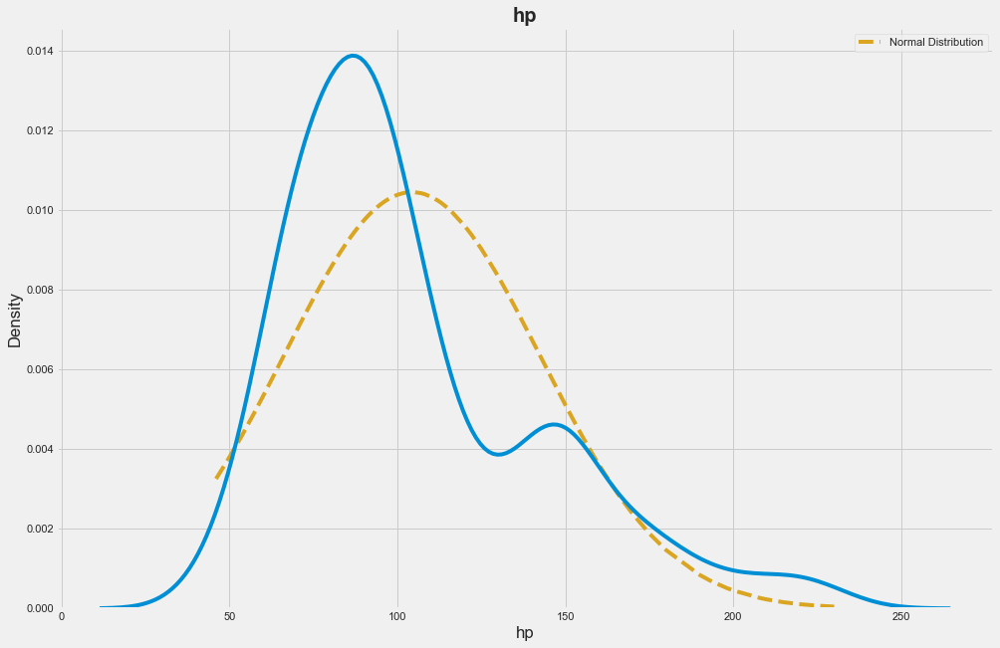

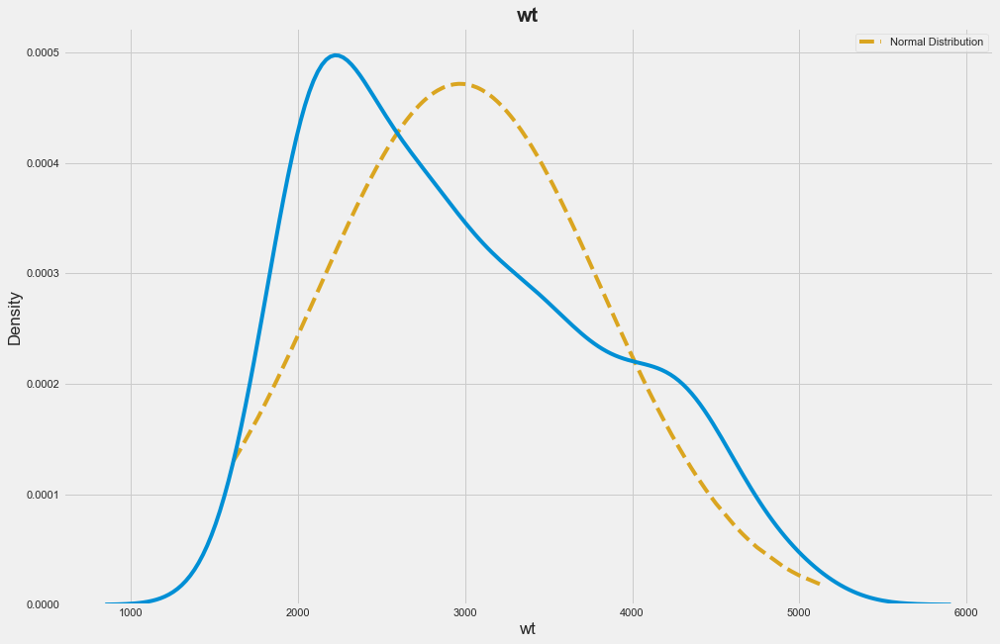

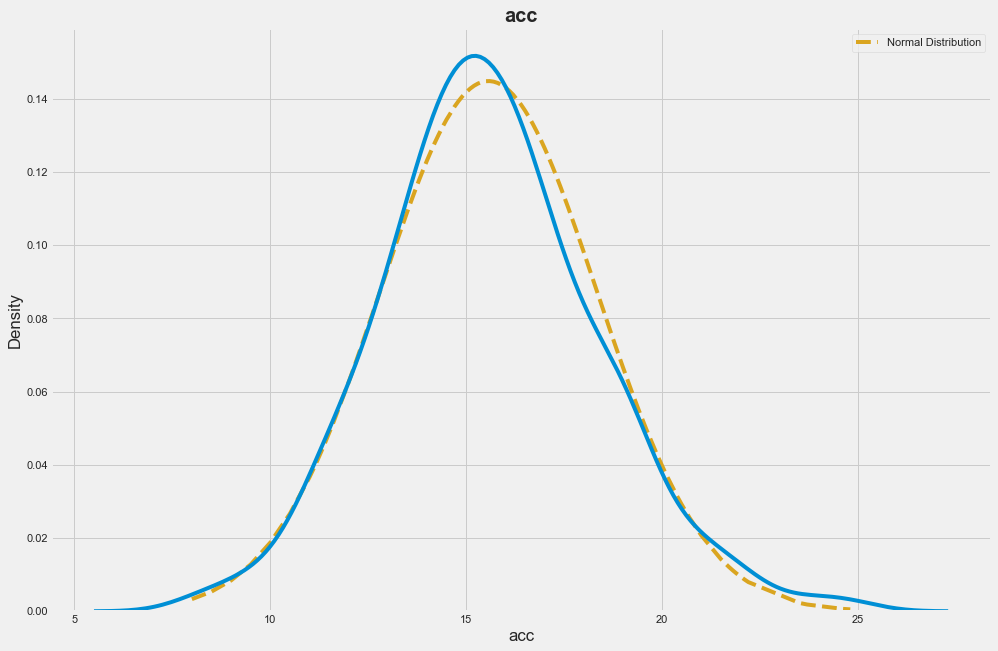

In [29]:
for i in  num_cols:
    fit=np.array(data[i])
    fit=sorted(fit)
    val=stats.norm.pdf(fit,np.mean(fit),np.std(fit))
    plt.plot(fit,val,linestyle="--",color='goldenrod',label="Normal Distribution")
    sns.kdeplot(data[i]).set_title(i,fontsize=20,fontweight='bold')
    plt.legend()
    plt.show()

In [30]:
data[num_cols].iplot()

In [31]:
def numerical_viz(i):
    fig,ax=plt.subplots(1,2,figsize=(15,10))
    sns.distplot(data[i],ax=ax[0]).set_title(i,fontsize=20,fontweight='bold')
    ax[0].axvline(data[i].mean(),linestyle='--',color='r',label='Mean')
    ax[0].axvline(data[i].median(),linestyle='--',color='g',label='Median')
    ax[0].axvline(data[i].mode()[0],linestyle='--',color='gold',label='Mode')
    sns.boxplot(data[i],ax=ax[1]).set_title(i,fontsize=20,fontweight='bold')
    ax[0].legend()
    plt.show()

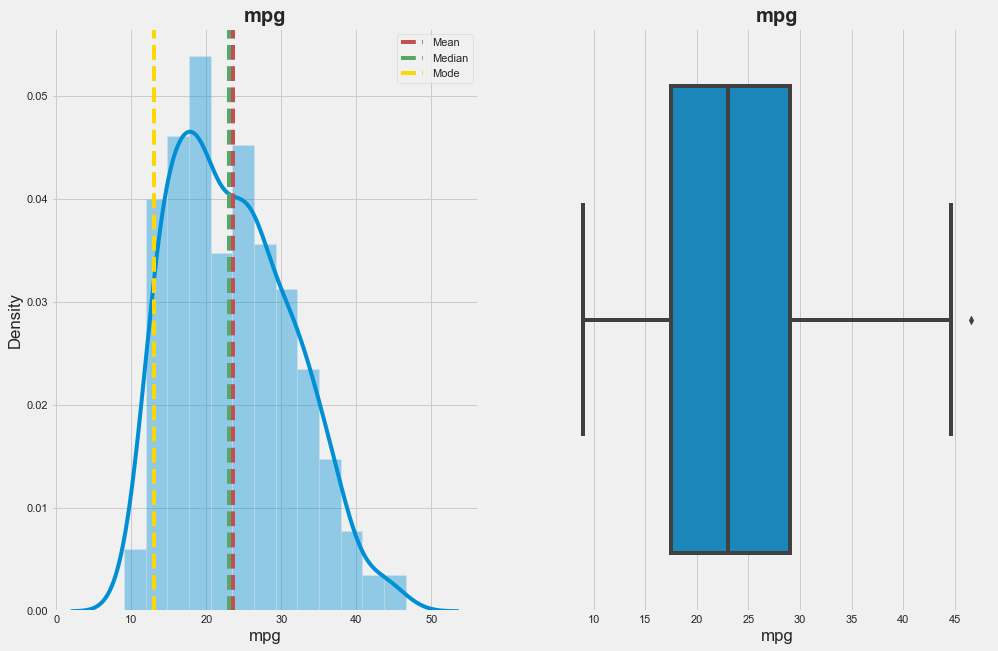

In [32]:
numerical_viz(num_cols[0])

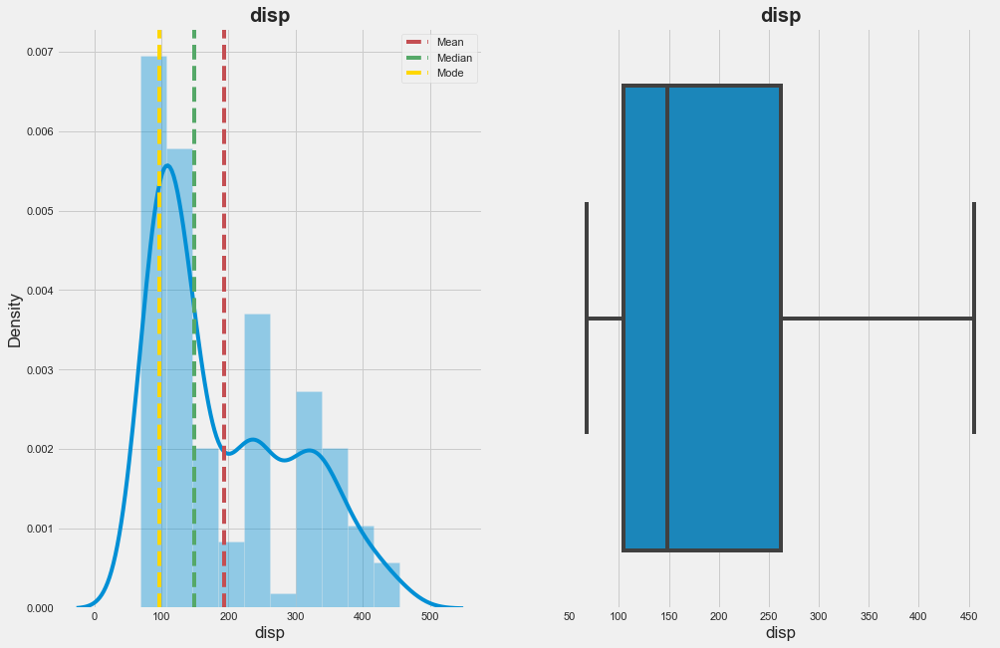

In [33]:
numerical_viz(num_cols[1])

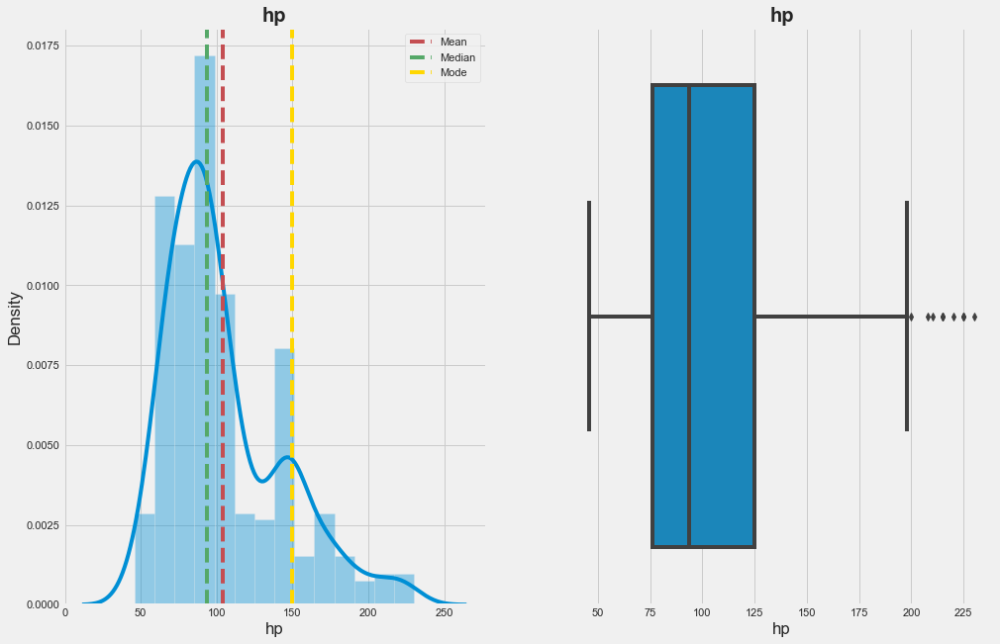

In [34]:
numerical_viz(num_cols[2])

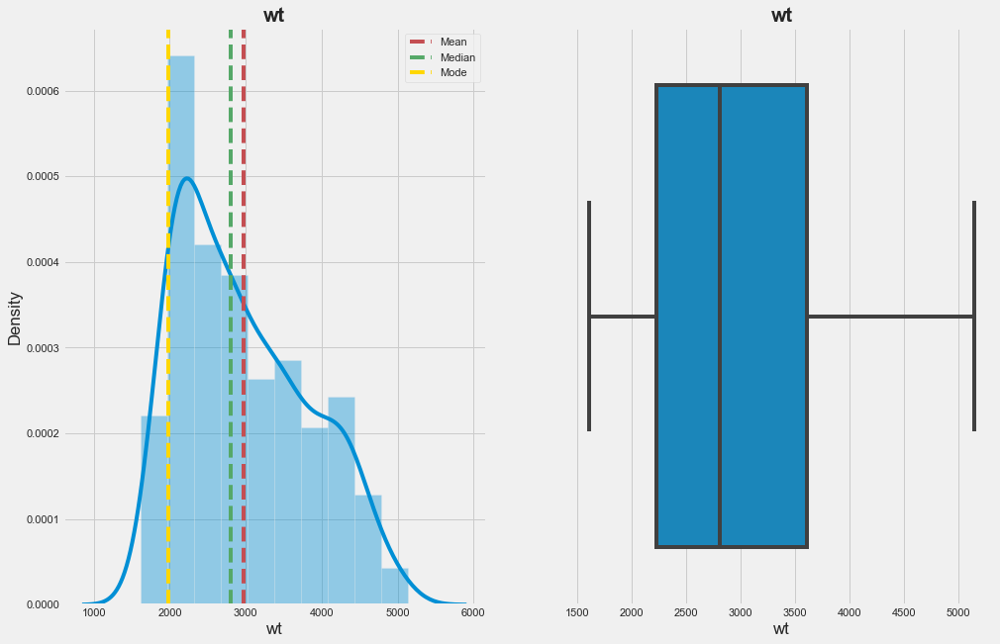

In [35]:
numerical_viz(num_cols[3])

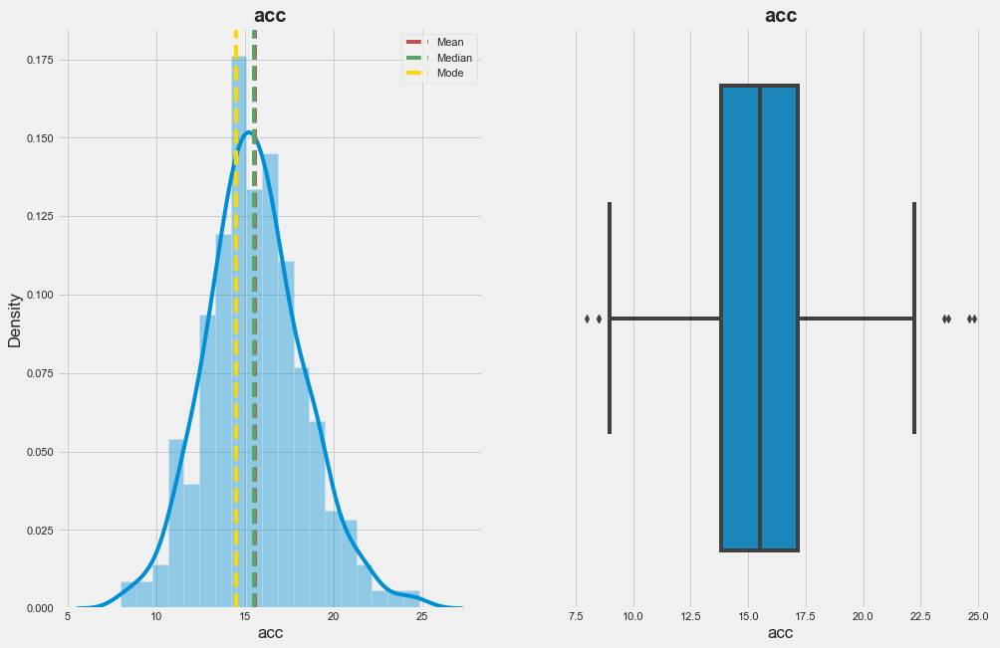

In [36]:
numerical_viz(num_cols[4])

### Categorical viz

In [37]:
def cat_viz(i):
    fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,8))
    data[i].value_counts().plot(kind='pie',autopct='%1.1f%%',textprops={'fontsize':10,'fontweight':"bold"},ax=ax1)
    ax1.set_title(i,fontsize=10,fontweight='bold')
    sns.countplot(data=data,x=data[i],ax=ax2)
    ax2.set_title(i,fontsize=10,fontweight='bold')
    ax2.set_ylabel("Count",fontsize=10,fontweight='bold')
    ax2.set_xlabel(i,fontsize=10,fontweight='bold')

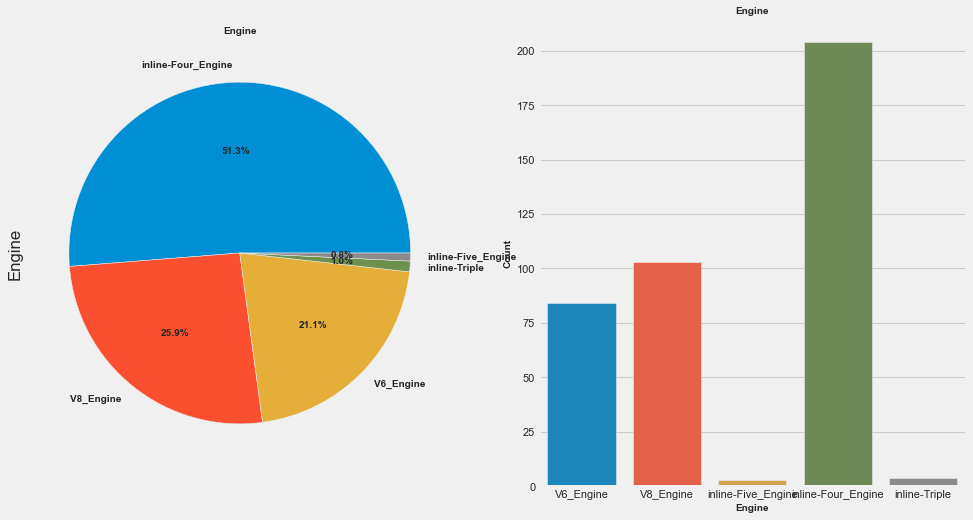

In [38]:
cat_viz(cat_cols[0])

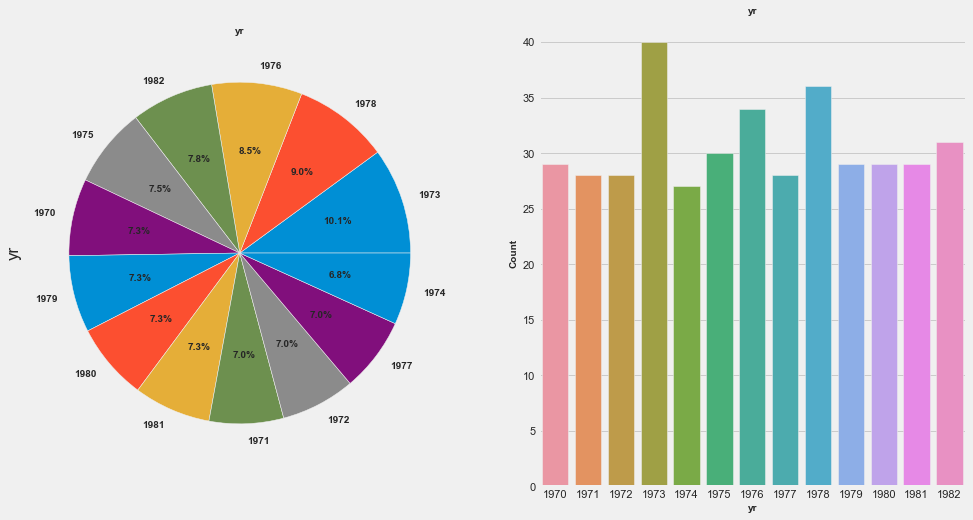

In [39]:
cat_viz(cat_cols[1])

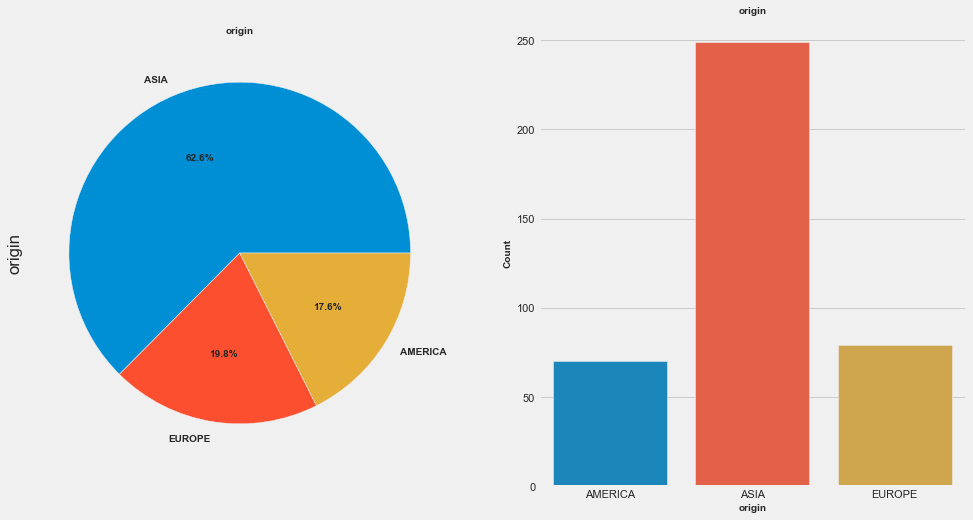

In [40]:
cat_viz(cat_cols[2])

In [41]:
fig = px.bar(data, y='Engine', x='yr', text='Engine', color='origin')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')

In [42]:
px.scatter(data, x="disp", y="hp", color="origin",
                 size='mpg', hover_data=['mpg'])

In [43]:
px.scatter(data, x="wt", y="hp", color="origin",
                 size='mpg', hover_data=['mpg'])

In [44]:
px.scatter(data, x="acc", y="hp", color="origin",
                 size='mpg', hover_data=['mpg'])

In [45]:
px.scatter(data, x="Engine", y="hp", color="origin",
                 size='mpg', hover_data=['mpg'])

In [46]:
fig = px.scatter_geo(data,
                     color="origin",
                     size="mpg", # size of markers
                     hover_name="Engine",
                     projection="orthographic")
fig

In [47]:
px.scatter_polar(data, r="acc", theta="wt", color="Engine",
                size="mpg", symbol="origin")

In [48]:
x=data[data['Engine']=='inline-Triple']['mpg']
y=data[data['Engine']=='inline-Four_Engine']['mpg']
z=data[data['Engine']=='inline-Five_Engine']['mpg']
i=data[data['Engine']=='V6_Engine']['mpg']
j=data[data['Engine']=='V8_Engine']['mpg']
stats,pval=f_oneway(x,y,z,i,j)
print(pval)
if pval <0.05:
    print("Reject the Null Hypothesis and hence Cyl has impact on the MPG {}".format(round(pval,2)))
else:
    
    print('Fail to  Reject the Null Hypothesis wheree there is no relationship between Cyl and MPG'.format(round(pval,2)))

3.679939295400561e-85
Reject the Null Hypothesis and hence Cyl has impact on the MPG 0.0


In [49]:
x=data[data['origin']=='ASIA']['mpg']
y=data[data['origin']=='EUROPE']['mpg']
z=data[data['origin']=='AMERICA']['mpg']
stats,pval=f_oneway(x,y,z)
print(pval)
if pval <0.05:
    print("Reject the Null Hypothesis and hence Origin has impact on the MPG {}".format(round(pval,2)))
else:
    
    print('Fail to  Reject the Null Hypothesis where there is no relationship between Origin and MPG'.format(round(pval,2)))

1.9154864184128e-35
Reject the Null Hypothesis and hence Origin has impact on the MPG 0.0


In [50]:
z1=data[data['yr']==1970]['mpg']
z2=data[data['yr']==1971]['mpg']
z3=data[data['yr']==1972]['mpg']
z4=data[data['yr']==1973]['mpg']
z5=data[data['yr']==1974]['mpg']
z6=data[data['yr']==1975]['mpg']
z7=data[data['yr']==1976]['mpg']
z8=data[data['yr']==1977]['mpg']
z9=data[data['yr']==1978]['mpg']
z10=data[data['yr']==1979]['mpg']
z11=data[data['yr']==1980]['mpg']
z12=data[data['yr']==1981]['mpg']
z13=data[data['yr']==1982]['mpg']
stats,pval=f_oneway(z1,z2,z3,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13)
print(pval)
if pval <0.05:
    print("Reject the Null Hypothesis and hence Origin has impact on the MPG {}".format(round(pval,2)))
else:
    
    print('Fail to  Reject the Null Hypothesis where there is no relationship between Origin and MPG'.format(round(pval,2)))

5.2640168845192595e-40
Reject the Null Hypothesis and hence Origin has impact on the MPG 0.0


### Checking Normality of Numerical columns

In [51]:
def normality_test(data,cols):
    stats,pval=shapiro(data[cols])
    if pval < 0.05:
        
        print('Reject the Null hypothesis of: ',cols)
    else:
        print('Fail to reject the Null hypothesis of: ',cols )

In [52]:
for i in num_cols:
    normality_test(data,i)

Reject the Null hypothesis of:  mpg
Reject the Null hypothesis of:  disp
Reject the Null hypothesis of:  hp
Reject the Null hypothesis of:  wt
Reject the Null hypothesis of:  acc


##### Testing independent ttest  with the target values

In [53]:
for i in num_cols:
    if i!='mpg':
        stats,pval=ttest_ind(data['mpg'],data[i])
        if pval<0.05:
            print('Reject the null hypotheisis meaning there is a significant difference between one another ',i)
        else:
            print('Fail to  Reject the null hypotheisis meaning there is no significant difference between one another ',i)

Reject the null hypotheisis meaning there is a significant difference between one another  disp
Reject the null hypotheisis meaning there is a significant difference between one another  hp
Reject the null hypotheisis meaning there is a significant difference between one another  wt
Reject the null hypotheisis meaning there is a significant difference between one another  acc


### Data preprocesing

In [54]:
Data=data.copy()

In [55]:
Data.corr().style.background_gradient('magma')

,mpg,disp,hp,wt,acc
mpg,1.000000,-0.804203,-0.773453,-0.831741,0.420289
disp,-0.804203,1.000000,0.895778,0.932824,-0.543684
hp,-0.773453,0.895778,1.000000,0.862442,-0.686590
wt,-0.831741,0.932824,0.862442,1.000000,-0.417457
acc,0.420289,-0.543684,-0.686590,-0.417457,1.000000


In [56]:
Data['hp']=np.log(Data['hp'])

In [57]:
Data['wt']=np.log(Data['wt'])

In [58]:
Data[['mpg','disp','hp','wt','acc']]=Data[['mpg','disp','hp','wt','acc']].apply(zscore)

In [59]:
label=LabelEncoder()
Data['yr']=label.fit_transform(Data['yr'])

In [60]:
Data=pd.get_dummies(Data,columns=['origin','Engine'])

### Modeling

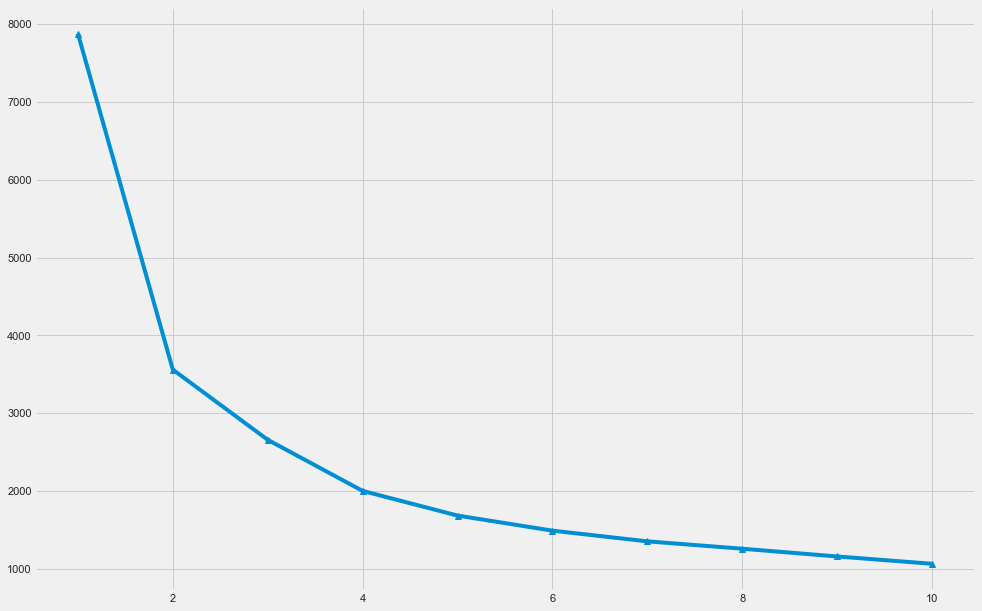

In [61]:
wcss=[]
for i in range(1,11):
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(Data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss,marker="^")

###### Silhouette score for cluster 2

In [62]:
kmeans=KMeans(n_clusters=2)
kmeans.fit(Data)
silhouette_score(Data,kmeans.labels_)

0.4355695541612198

In [63]:
kmeans_labels=data.copy()
kmeans_labels['Cluster']=kmeans.labels_

In [64]:
px.scatter(kmeans_labels, x='acc', y="mpg",size='mpg' ,color="Cluster")

### Hierarchical clustering

In [65]:
agg=AgglomerativeClustering(n_clusters=2,affinity='euclidean',linkage='average')
agg.fit(Data)
silhouette_score(Data,agg.labels_)

0.36771644348133

In [66]:
Z=linkage(Data,method='average', metric='euclidean')
c,cop=cophenet(Z,pdist(Data))
print(c)

0.6716452424531814


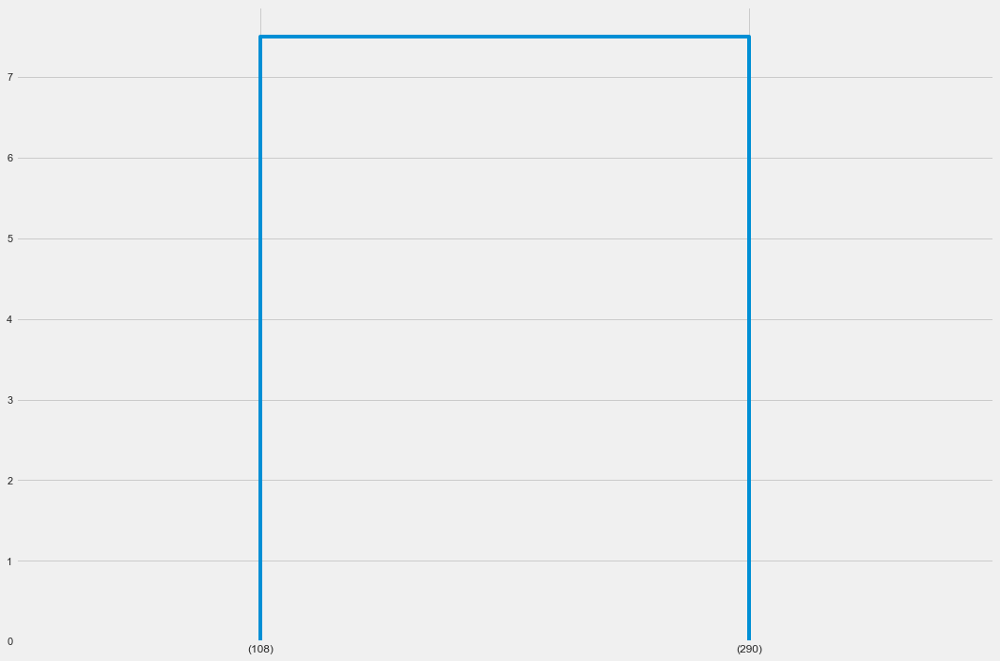

In [67]:
dendrogram(Z,p=2,truncate_mode='lastp')
plt.tight_layout()

#### Answer below questions

In [68]:
result=kmeans_labels.groupby('Cluster').mean()
result['Frequency']=kmeans_labels.Cluster.sort_index()

### RESULT

In [69]:
result

,mpg,disp,hp,wt,acc,Frequency
Cluster,,,,,,
0,19.200000,232.373171,118.907317,3258.760976,14.897073,0
1,28.097409,152.056995,88.792746,2664.160622,16.280829,0


In [70]:
kmeans=KMeans(n_clusters=2)
kmeans.fit(Data)
Data['cluster']=kmeans.labels_

In [71]:
cluster1=Data[Data['cluster']==0]
cluster2=Data[Data['cluster']==1]

In [72]:
cluster1.shape

(205, 15)

In [73]:
cluster2.shape

(193, 15)

In [74]:
x1=cluster1.drop(['mpg','cluster'],1)
y1=cluster1[['mpg']]

x2=cluster2.drop(['mpg','cluster'],1)
y2=cluster2[['mpg']]


In [75]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.3,random_state=42)

In [76]:
lr1=LinearRegression()
lr1.fit(x_train,y_train)
yhat=lr1.predict(x_test)
print('Train score :',lr1.score(x_train,y_train))
print('Test score :',lr1.score(x_test,y_test))
print("R2_score: ",metrics.r2_score(y_test,yhat))
print("Mean absolute error: ",metrics.mean_absolute_error(y_test,yhat))

Train score : 0.8812158301045376
Test score : 0.8933489354410714
R2_score:  0.8933489354410714
Mean absolute error:  0.1847691506350697


In [77]:
X=sm.add_constant(x1)
result=sm.OLS(y1,X).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.888
Model:                            OLS   Adj. R-squared:                  0.882
Method:                 Least Squares   F-statistic:                     153.8
Date:                Sat, 06 Nov 2021   Prob (F-statistic):           1.49e-86
Time:                        21:18:22   Log-Likelihood:                 1.2328
No. Observations:                 205   AIC:                             19.53
Df Residuals:                     194   BIC:                             56.09
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.3927      0.037    -10.556      0.000      -0.466      -0.319
disp                         -0.0068      0.068     -0.099      0.921      -0.141       0.128
hp                           -0.1823      0.059     -3.116      0.002      -0.298      -0.067
wt                           -0.3862      0.063     -6.153      0.000      -0.510      -0.262
acc                          -0.1012      0.034     -3.013      0.003      -0.168      -0.035
yr                            0.0278      0.010      2.751      0.007       0.008       0.048
origin_AMERICA               -0.1617      0.044     -3.670      0.000      -0.249      -0.075
origin_ASIA                  -0.2352      0.042     -5.613      0.000      -0.318      -0.153
origin_EUROPE                 0.0041      0.046      0.090      0.928      -0.086       0.094
Engine_V6_Engine              0.0752      0.060      1.262      0.208      -0.042       0.193
Engine_V8_Engine              0.0200      0.096      0.207      0.836      -0.170       0.210
Engine_inline-Five_Engine          0          0        nan        nan           0           0
Engine_inline-Four_Engine     0.2900      0.067      4.337      0.000       0.158       0.422
Engine_inline-Triple         -0.7779      0.157     -4.963      0.000      -1.087      -0.469
==============================================================================
Omnibus:                        0.903   Durbin-Watson:                   1.446
Prob(Omnibus):                  0.637   Jarque-Bera (JB):                0.626
Skew:                          -0.114   Prob(JB):                        0.731
Kurtosis:                       3.147   Cond. No.                     1.41e+33
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.46e-63. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

<AxesSubplot:xlabel='mpg'>

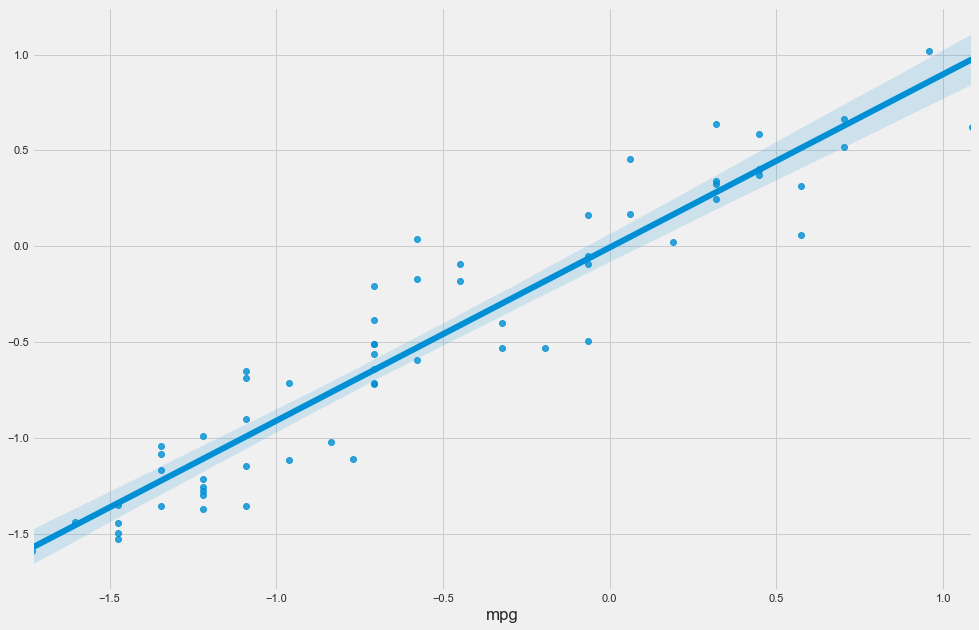

In [78]:
sns.regplot(y_test,yhat)

In [79]:
vals1=lr1.coef_
pd.DataFrame(vals1,columns=x1.columns).T

,0
disp,0.032623
hp,-0.144074
wt,-0.399184
acc,-0.061858
yr,0.027799
origin_AMERICA,0.021363
origin_ASIA,-0.128979
origin_EUROPE,0.107616
Engine_V6_Engine,0.121529
Engine_V8_Engine,0.016105


In [80]:
X_train,X_test,Y_train,Y_test=train_test_split(x2,y2,test_size=0.30,random_state=1)
lr2=LinearRegression()
lr2.fit(X_train,Y_train)
yhat=lr1.predict(X_test)
print('Train score :',lr2.score(X_train,Y_train))
print('Test score :',lr2.score(X_test,Y_test))
print("R2_score: ",metrics.r2_score(Y_test,yhat))
print("Mean absolute error: ",metrics.mean_absolute_error(Y_test,yhat))

Train score : 0.8065233133993693
Test score : 0.7981859645529976
R2_score:  0.44101206065890264
Mean absolute error:  0.4965003805776734


In [81]:
X=sm.add_constant(x2)
result=sm.OLS(y2,X).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     69.49
Date:                Sat, 06 Nov 2021   Prob (F-statistic):           5.78e-59
Time:                        21:18:23   Log-Likelihood:                -98.000
No. Observations:                 193   AIC:                             220.0
Df Residuals:                     181   BIC:                             259.2
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.6987      0.115     -6.077      0.000      -0.926      -0.472
disp                          0.1510      0.195      0.774      0.440      -0.234       0.536
hp                           -0.3829      0.109     -3.518      0.001      -0.598      -0.168
wt                           -0.6376      0.128     -4.991      0.000      -0.890      -0.386
acc                          -0.0024      0.054     -0.044      0.965      -0.109       0.104
yr                            0.1468      0.017      8.789      0.000       0.114       0.180
origin_AMERICA               -0.0908      0.068     -1.337      0.183      -0.225       0.043
origin_ASIA                  -0.4053      0.062     -6.497      0.000      -0.528      -0.282
origin_EUROPE                -0.2026      0.069     -2.930      0.004      -0.339      -0.066
Engine_V6_Engine             -0.2051      0.101     -2.026      0.044      -0.405      -0.005
Engine_V8_Engine              0.0591      0.216      0.274      0.784      -0.366       0.484
Engine_inline-Five_Engine    -0.0034      0.226     -0.015      0.988      -0.449       0.442
Engine_inline-Four_Engine    -0.0856      0.116     -0.734      0.464      -0.315       0.144
Engine_inline-Triple         -0.4637      0.296     -1.565      0.119      -1.048       0.121
==============================================================================
Omnibus:                       18.507   Durbin-Watson:                   1.686
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               25.176
Skew:                           0.608   Prob(JB):                     3.41e-06
Kurtosis:                       4.286   Cond. No.                     8.71e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.34e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

<AxesSubplot:xlabel='mpg'>

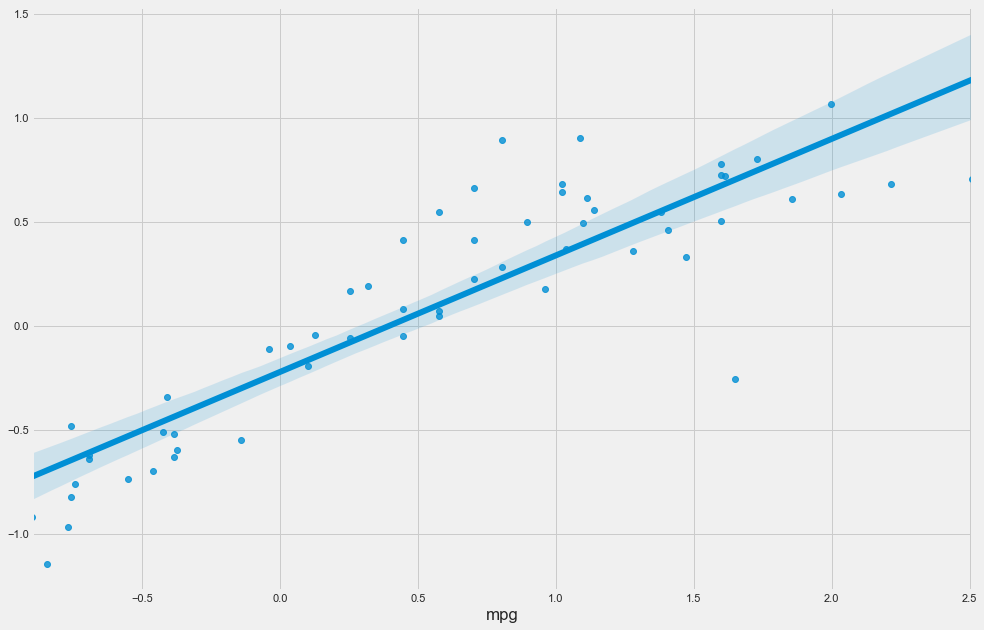

In [82]:
sns.regplot(Y_test,yhat)

In [83]:
vals2=lr2.coef_
pd.DataFrame(vals2,columns=x2.columns).T

,0
disp,0.265644
hp,-0.458707
wt,-0.645821
acc,-0.057675
yr,0.166209
origin_AMERICA,0.202390
origin_ASIA,-0.204568
origin_EUROPE,0.002178
Engine_V6_Engine,-0.055366
Engine_V8_Engine,0.188479


##### Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future

## Part-2

#### DOMAIN: Manufacturing
• CONTEXT: Company X curates and packages wine across various vineyards spread throughout the country.

### • PROJECT OBJECTIVE: Goal is to build a synthetic data generation model using the existing data provided by the company.
Steps and tasks: [ Total Score: 5 points]
1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data.

#### Importing the Data

In [84]:
data=pd.read_excel('Part2 - Company.xlsx')
data.head()

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [85]:
data.tail()

,A,B,C,D,Quality
56,200,186,185,179,Quality B
57,137,182,165,199,NaN
58,88,39,9,102,NaN
59,180,157,192,198,NaN
60,157,135,135,156,NaN


In [86]:
data.sample(5)

,A,B,C,D,Quality
8,160,181,194,178,Quality B
3,61,23,3,44,Quality A
7,191,144,143,154,NaN
13,45,76,56,57,Quality A
28,85,58,44,32,Quality A


In [87]:
data.shape

(61, 5)

In [88]:
data.dtypes

A           int64
B           int64
C           int64
D           int64
Quality    object
dtype: object

In [89]:
data.isna().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [90]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
A,61.0,NaN,NaN,NaN,118.557377,61.771494,3.0,61.0,136.0,171.0,200.0
B,61.0,NaN,NaN,NaN,116.639344,57.897908,5.0,63.0,138.0,168.0,200.0
C,61.0,NaN,NaN,NaN,114.081967,65.615368,3.0,59.0,135.0,174.0,200.0
D,61.0,NaN,NaN,NaN,114.459016,63.144431,3.0,51.0,132.0,174.0,199.0
Quality,43,2,Quality A,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Data analysis  and  Data Visualization

In [91]:
num_cols=data.select_dtypes(include='int64').columns

In [92]:
def numerical_viz(i):
    fig,ax=plt.subplots(1,2,figsize=(15,10))
    sns.distplot(data[i],ax=ax[0]).set_title(i,fontsize=20,fontweight='bold')
    ax[0].axvline(data[i].mean(),linestyle='--',color='r',label='Mean')
    ax[0].axvline(data[i].median(),linestyle='--',color='blue',label='Medain')
    ax[0].axvline(data[i].mode()[0],linestyle='--',color='gold',label='Mode')
    sns.boxplot(data[i],ax=ax[1]).set_title(i,fontsize=20,fontweight='bold')
    sns.stripplot(data[i],ax=ax[1])
    ax[0].legend()
    plt.show()

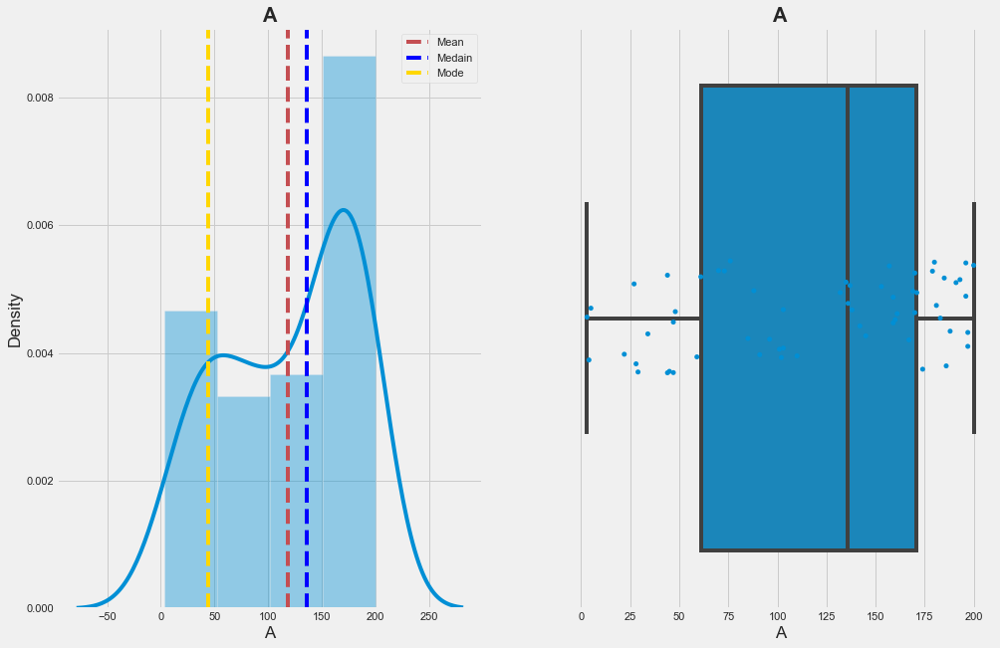

In [93]:
numerical_viz(num_cols[0])

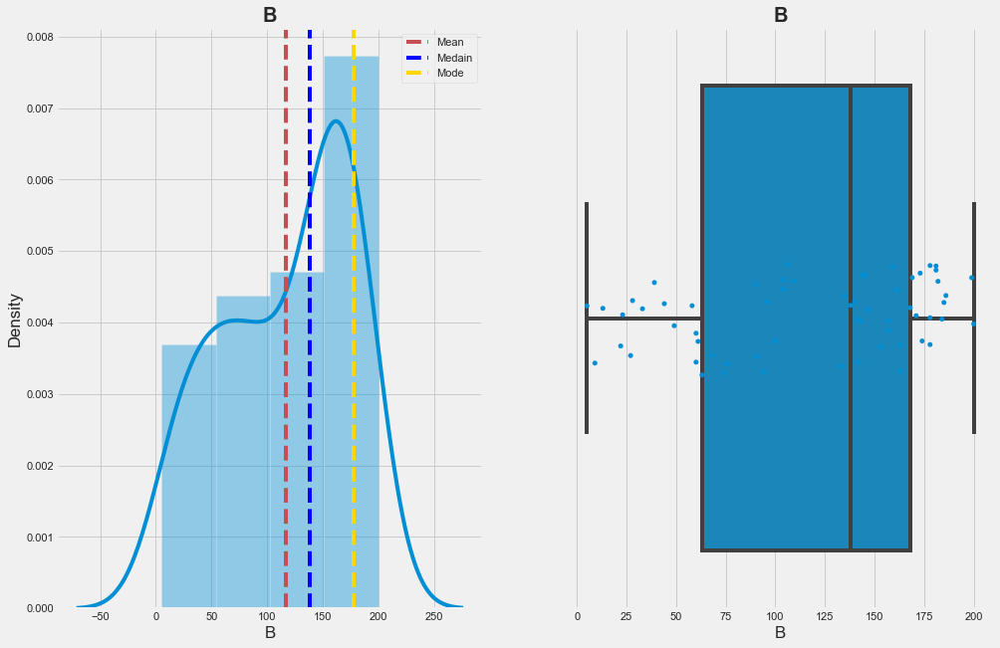

In [94]:
numerical_viz(num_cols[1])

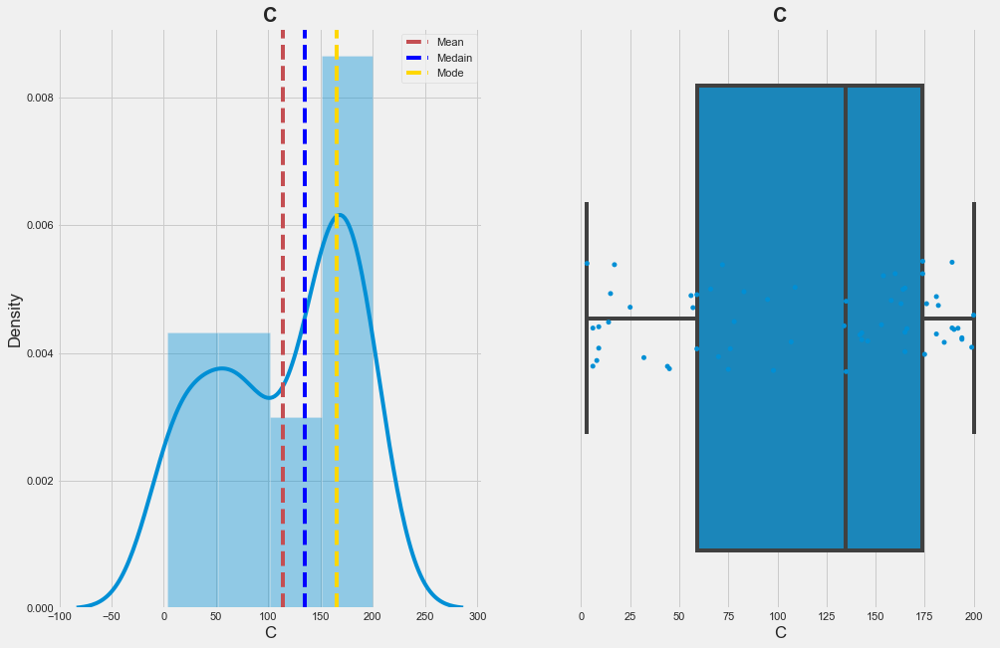

In [95]:
numerical_viz(num_cols[2])

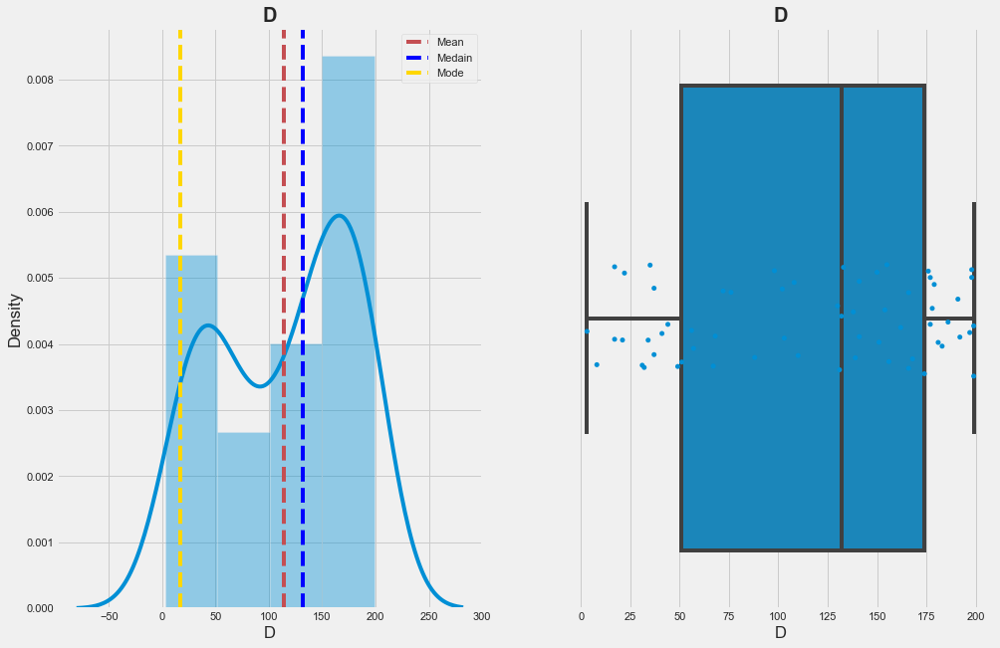

In [96]:
numerical_viz(num_cols[3])

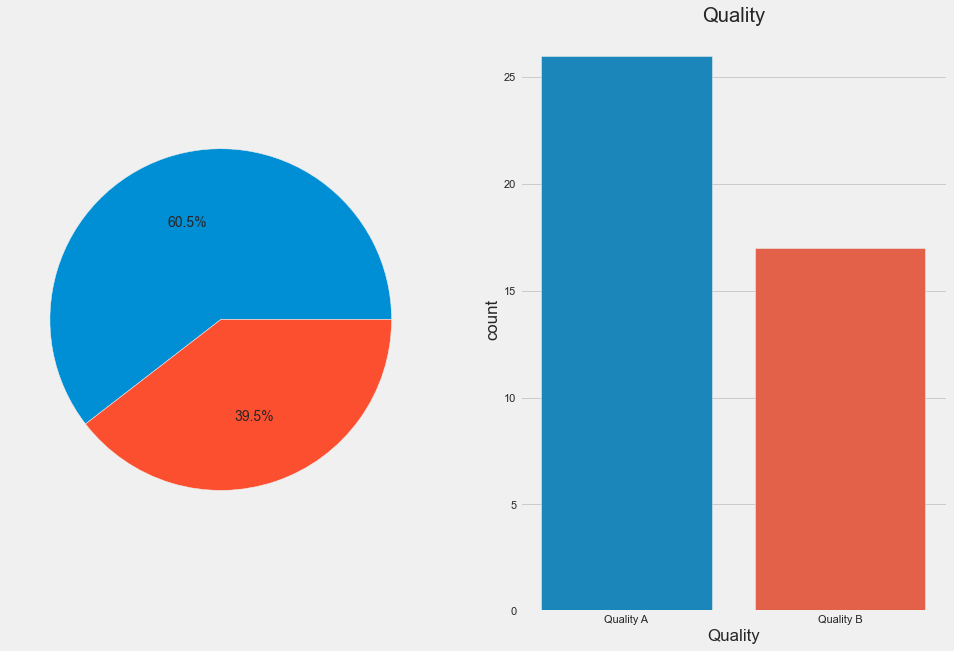

In [97]:
plt.subplot(121)
plt.pie(data['Quality'].value_counts(),autopct='%1.1f%%')
plt.subplot(122)
sns.countplot(data['Quality'])
plt.title('Quality')
plt.show()

#### Data preprocessing

In [98]:
Data=data.copy()

In [99]:
Data[['A','B','C','D']]=Data[['A','B','C','D']].apply(zscore)

##### Kmeans

In [100]:
x=Data.iloc[:,:-1]
kmean=KMeans(n_clusters=2)
kmean.fit(x)
yhat=kmean.labels_
silhouette_score(x,yhat)

0.6891674125195145

In [101]:
Data['Quality_pred']=yhat

In [102]:
Data['Quality_pred']=Data['Quality_pred'].replace({0:'Quality A',1:'Quality B'})

In [103]:
Data.dropna(inplace=True)

<AxesSubplot:>

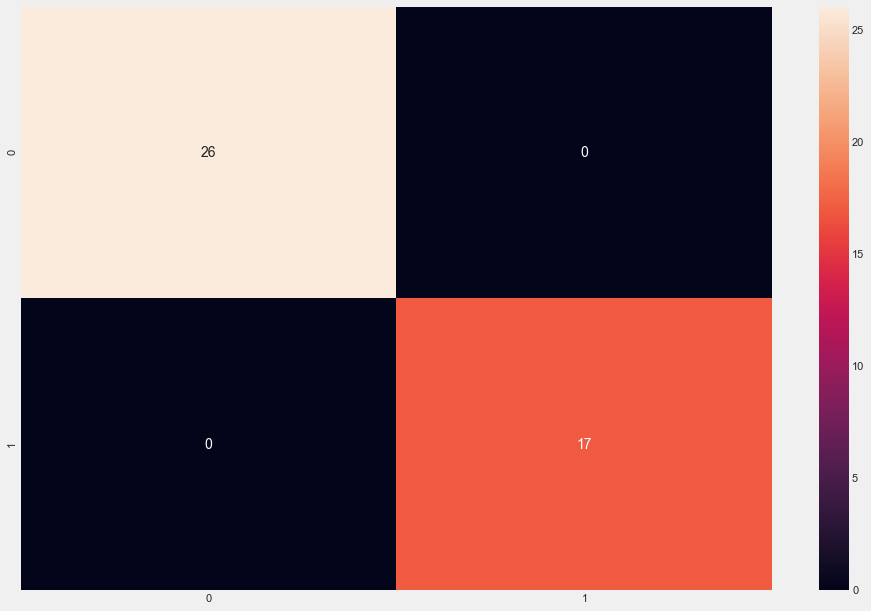

In [104]:
sns.heatmap(metrics.confusion_matrix(Data['Quality'],Data['Quality_pred']),annot=True)

In [108]:
Data.drop('Quality_pred',1,inplace=True)

In [109]:
data['Quality_pred']=yhat
data['Quality_pred']=data['Quality_pred'].replace({0:'Quality A',1:"Quality B"})

In [110]:
data.head()

,A,B,C,D,Quality,Quality_pred
0,47,27,45,108,Quality A,Quality A
1,174,133,134,166,Quality B,Quality B
2,159,163,135,131,NaN,Quality B
3,61,23,3,44,Quality A,Quality A
4,59,60,9,68,Quality A,Quality A


##### Summary:

In [111]:
new_data=data.drop('Quality',1)
new_data.groupby('Quality_pred').mean()

,A,B,C,D
Quality_pred,,,,
Quality A,58.75000,60.928571,49.750000,53.000000
Quality B,169.30303,163.909091,168.666667,166.606061


#### Staistical testing 

In [112]:
num_cols

Index(['A', 'B', 'C', 'D'], dtype='object')

In [113]:
for i in num_cols:
    x=new_data[new_data['Quality_pred']=='Quality A'][i]
    y=new_data[new_data['Quality_pred']=='Quality B'][i]
    stats,pval=ttest_ind(x,y )
    if pval<0.05:
        print('Reject the Null Hypothesis of {}  where the p_value is {}'.format(i,round(pval,4)))
    else:
        print('Fail to  Reject the Null Hypothesis of {}  where the p_value is {}'.format(i,round(pval,4)))

Reject the Null Hypothesis of A  where the p_value is 0.0
Reject the Null Hypothesis of B  where the p_value is 0.0
Reject the Null Hypothesis of C  where the p_value is 0.0
Reject the Null Hypothesis of D  where the p_value is 0.0


#### Part 3

### DOMAIN: Automobile
• CONTEXT: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette.
The vehicle may be viewed from one of many different angles

### PROJECT OBJECTIVE: Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the model using just the raw data.
Steps and tasks: [ Total Score: 20 points]
1. Data: Import, clean and pre-process the data
2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden
patterns by using all possible methods.
For example: Use your best analytical approach to build this report. Even you can mix match columns to create new columns which can be used
for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.
3. Classifier: Design and train a best fit SVM classier using all the data attributes.
4. Dimensional reduction: perform dimensional reduction on the data.
5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.
6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

#### Data: Import, clean and pre-process the data

In [127]:
data=pd.read_csv('Part3 - vehicle.csv')
data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [128]:
data.tail()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car
845,85,36.0,66.0,123.0,55.0,5,120.0,56.0,17.0,128,140.0,212.0,131.0,73.0,1.0,18.0,186.0,190,van


In [129]:
data.sample(5)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
355,93,42.0,88.0,188.0,62.0,10,183.0,36.0,21.0,141,208.0,504.0,168.0,70.0,3.0,12.0,189.0,197,car
457,83,45.0,73.0,161.0,68.0,8,142.0,46.0,18.0,144,169.0,305.0,179.0,71.0,10.0,3.0,191.0,199,van
296,98,52.0,86.0,207.0,69.0,5,192.0,33.0,22.0,161,212.0,570.0,221.0,75.0,4.0,6.0,194.0,195,bus
550,86,38.0,58.0,119.0,56.0,4,118.0,57.0,17.0,129,140.0,208.0,152.0,78.0,9.0,2.0,184.0,186,van
189,90,36.0,78.0,179.0,64.0,8,157.0,42.0,19.0,126,182.0,367.0,142.0,66.0,1.0,20.0,192.0,198,car


In [130]:
data.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [131]:
data.shape

(846, 19)

In [132]:
data.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [133]:
for i in data.iloc[:,:-1].columns:
    data[i]=data[i].fillna(data[i].median())

In [134]:
data.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

#### EDA

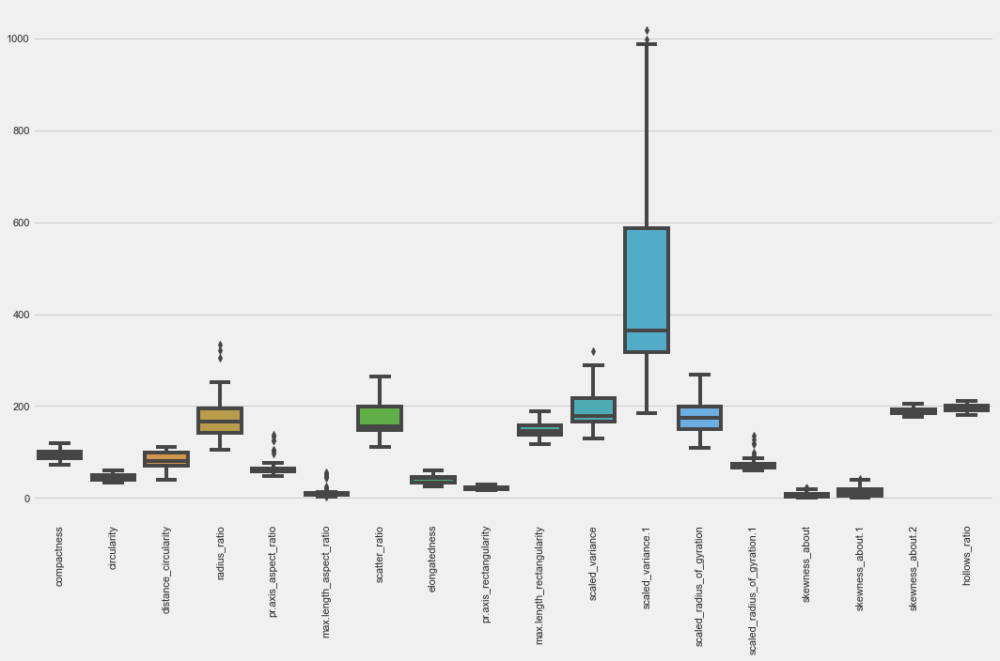

In [135]:
sns.boxplot(data=data)
plt.xticks(rotation=90)
plt.tight_layout()

In [136]:
num_cols=data.iloc[:,:-1].columns

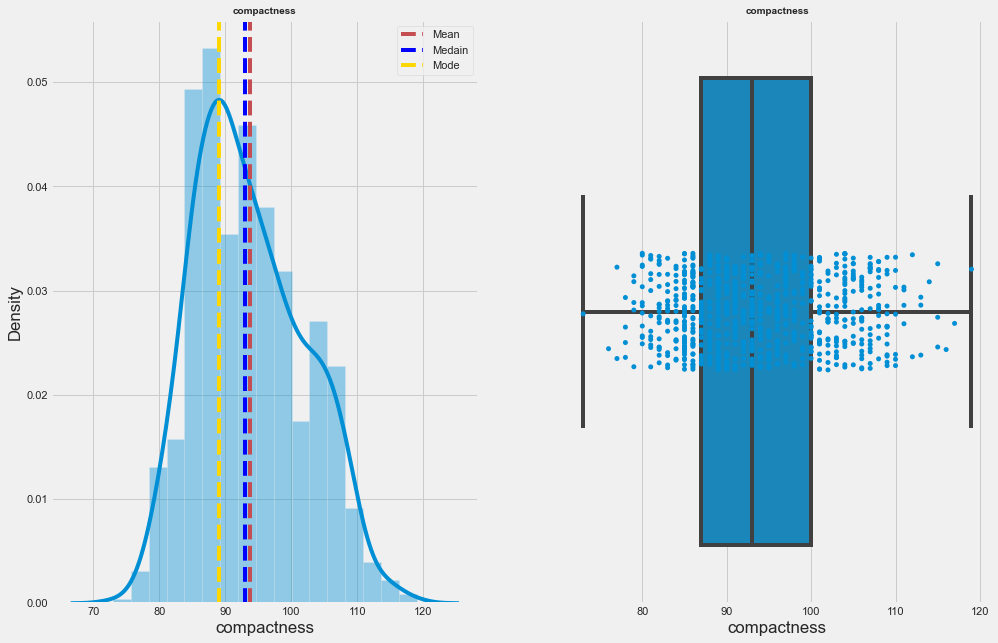

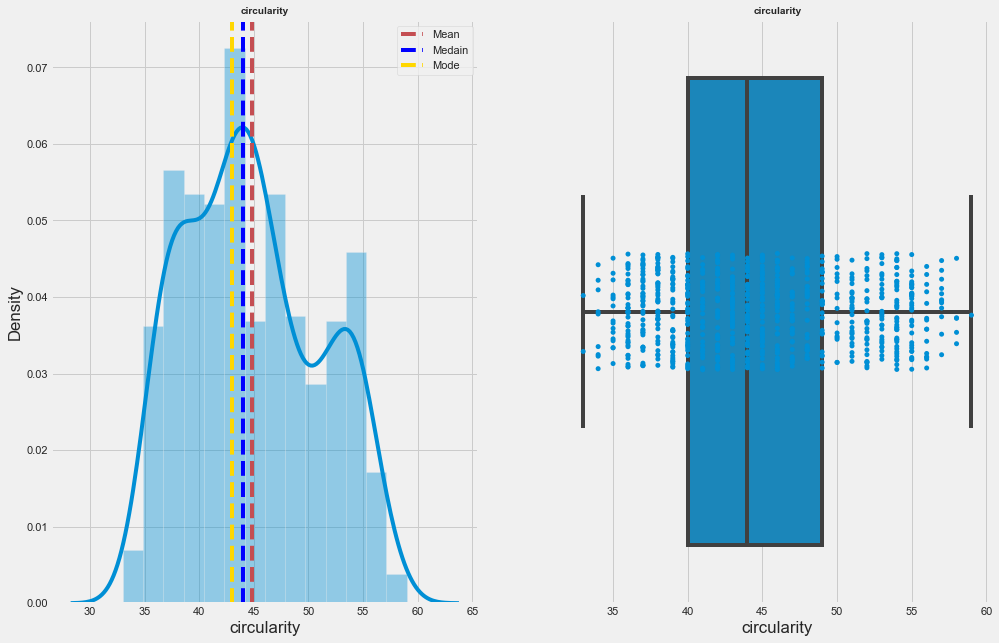

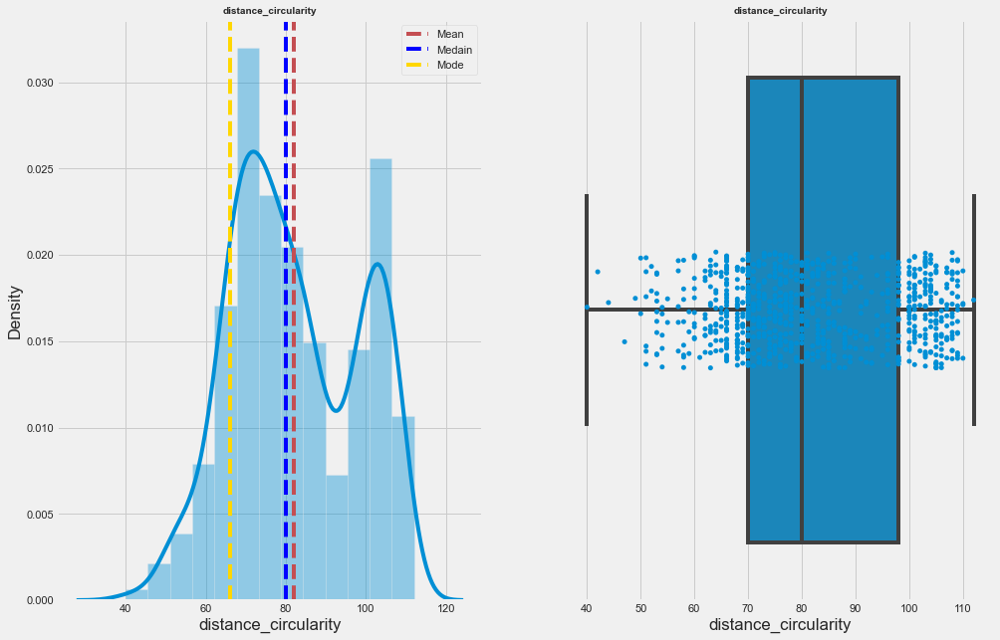

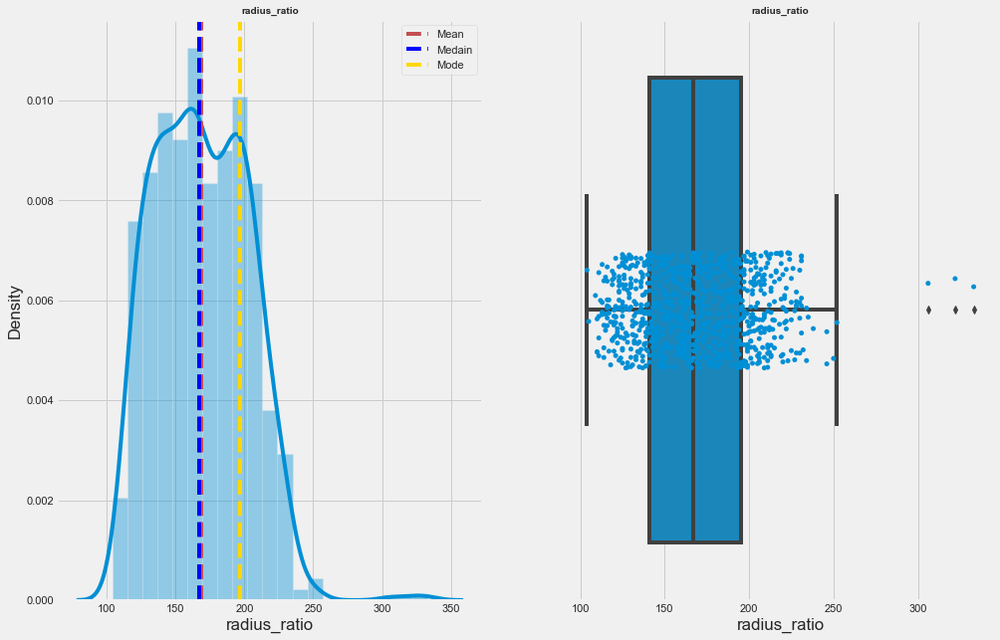

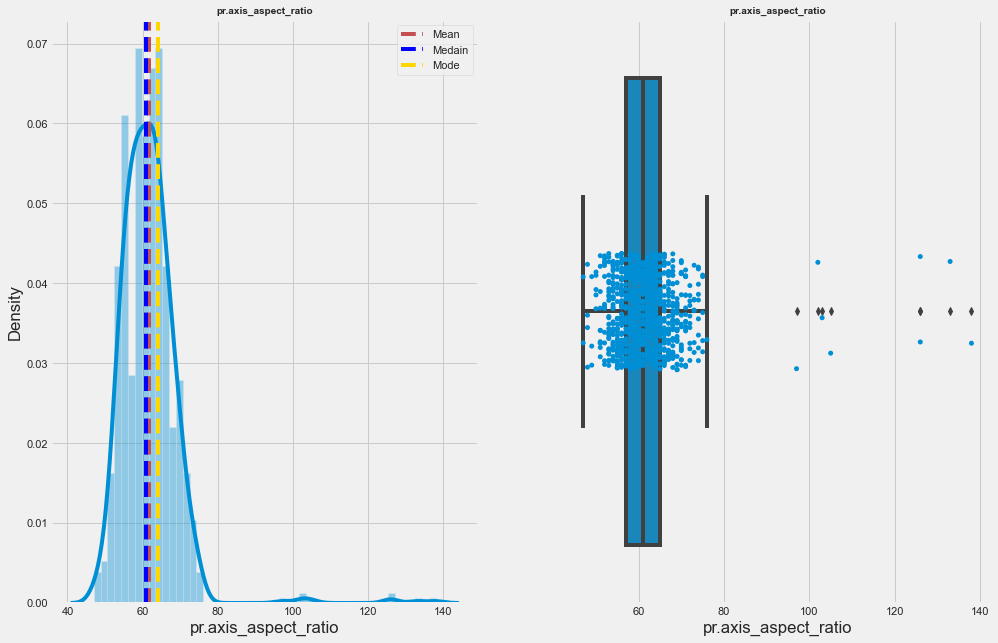

...

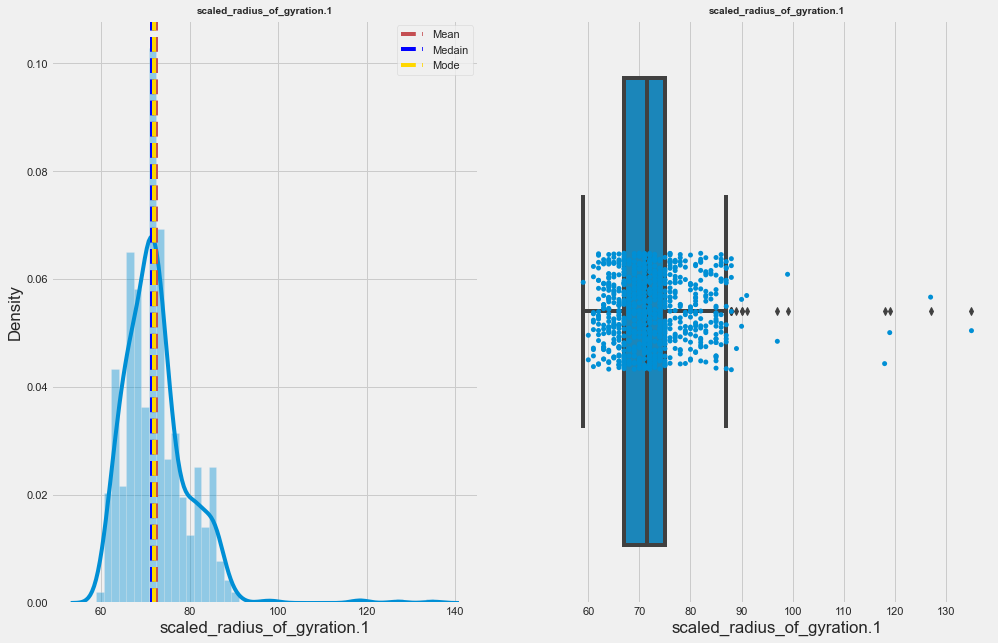

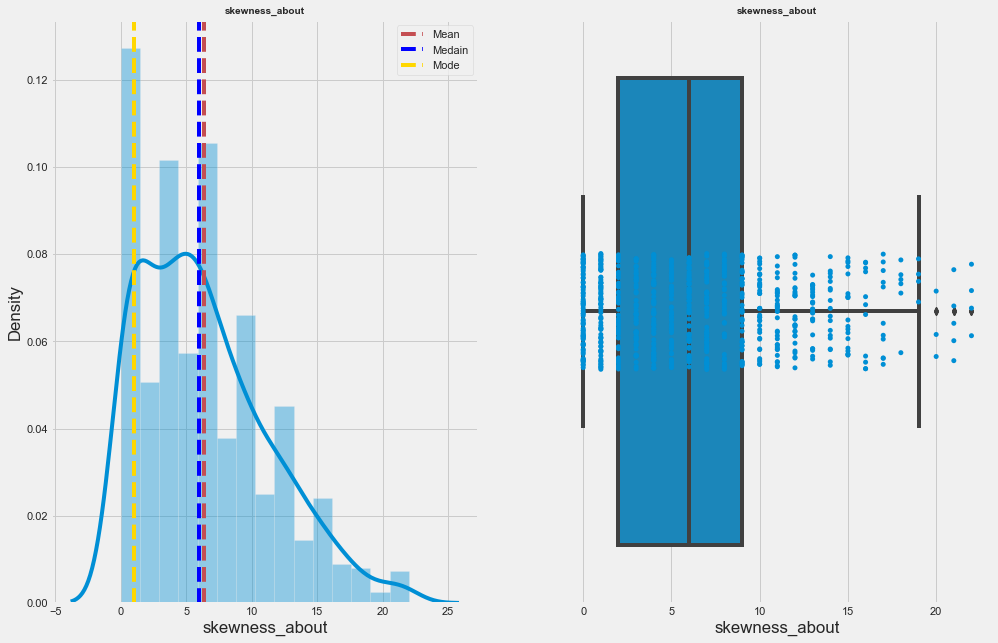

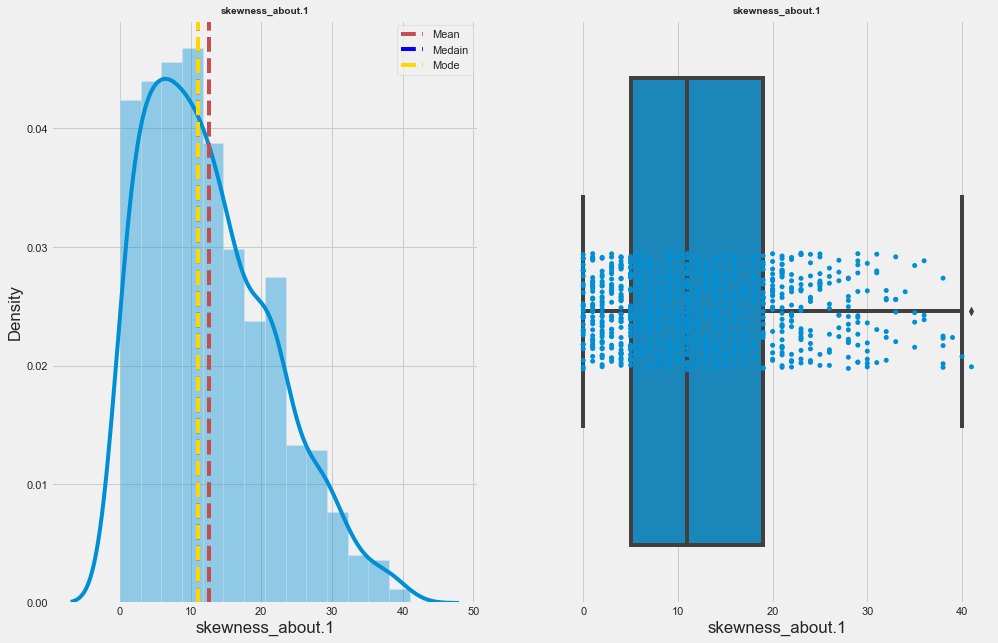

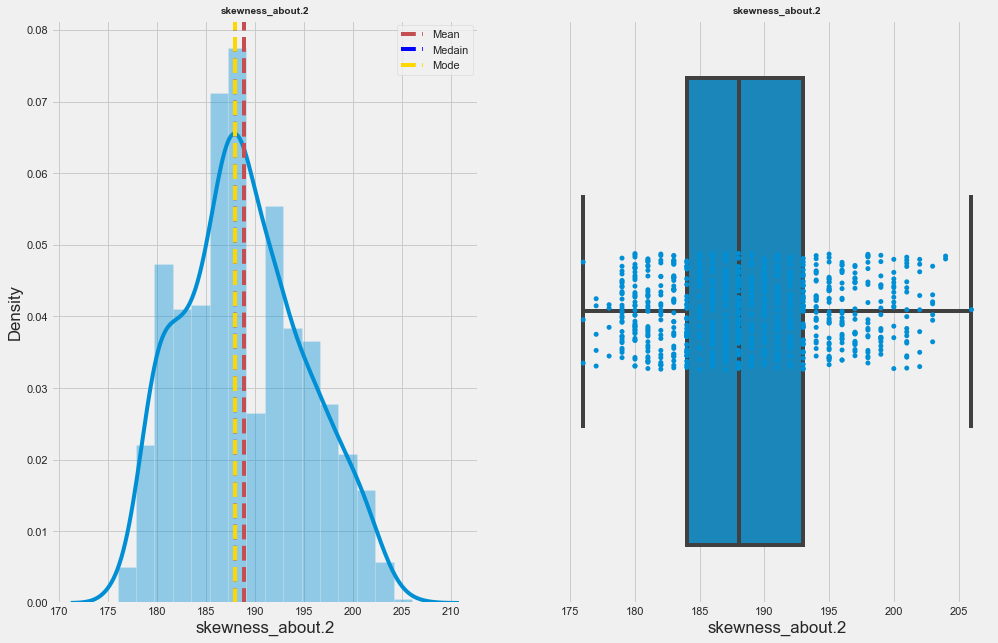

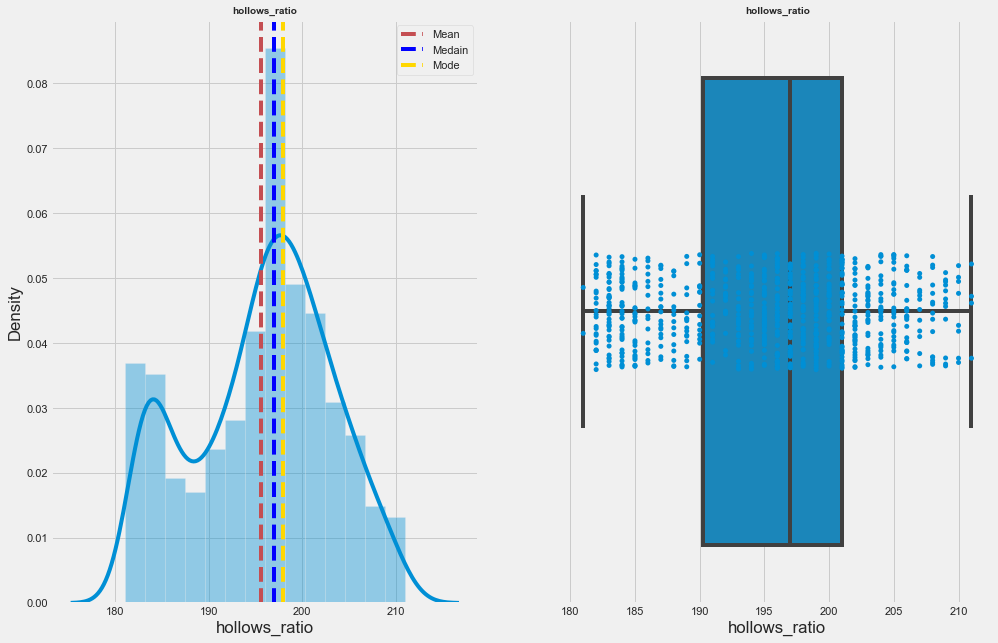

In [137]:
for i in num_cols:
    fig,ax=plt.subplots(1,2, figsize=(15,10))
    sns.distplot(data[i],ax=ax[0]).set_title(i,fontsize=10,fontweight='bold')
    sns.boxplot(data[i],ax=ax[1]).set_title(i,fontsize=10,fontweight='bold')
    sns.stripplot(data[i],ax=ax[1]).set_title(i,fontsize=10,fontweight='bold')
    ax[0].axvline(data[i].mean(),linestyle='--',color='r',label='Mean')
    ax[0].axvline(data[i].median(),linestyle='--',color='blue',label='Medain')
    ax[0].axvline(data[i].mode()[0],linestyle='--',color='gold',label='Mode')
    ax[0].legend()
    plt.show()

<AxesSubplot:ylabel='class'>

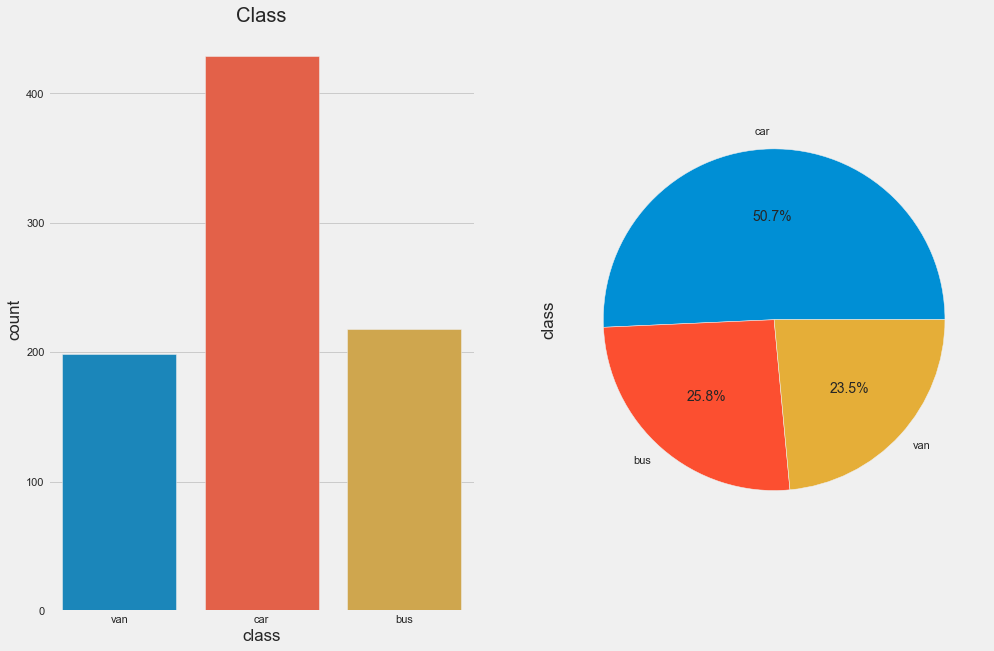

In [138]:
plt.subplot(121)
sns.countplot(data.iloc[:,-1]).set_title('Class')
plt.subplot(122)
data['class'].value_counts().plot(kind='pie',autopct="%1.1f%%")

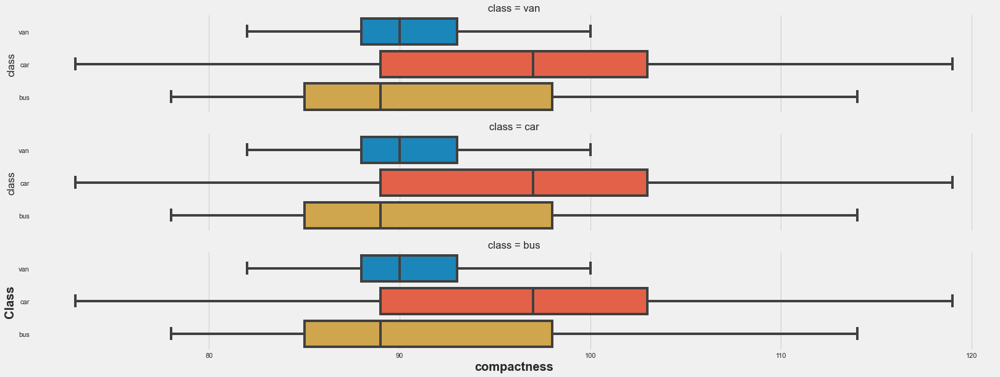

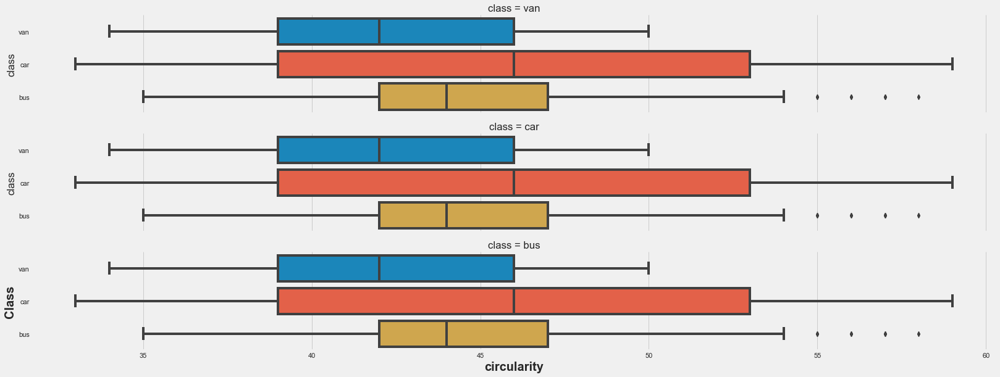

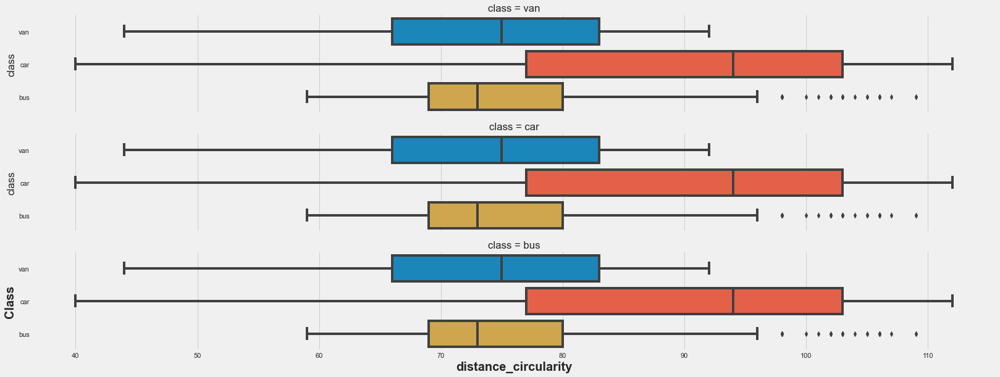

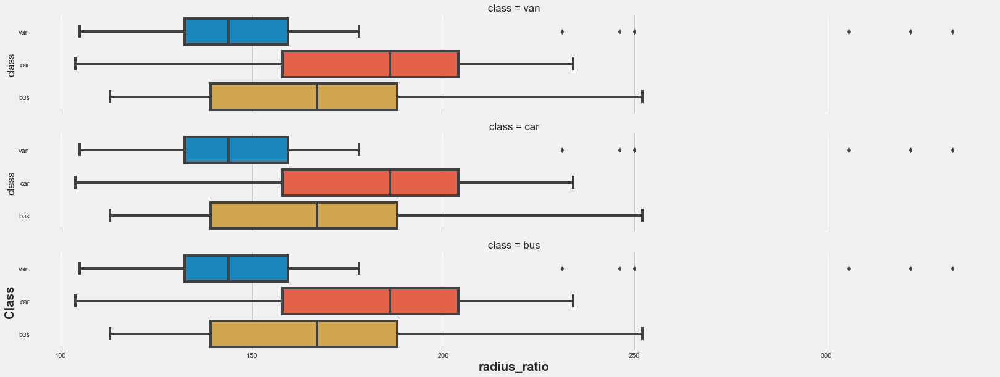

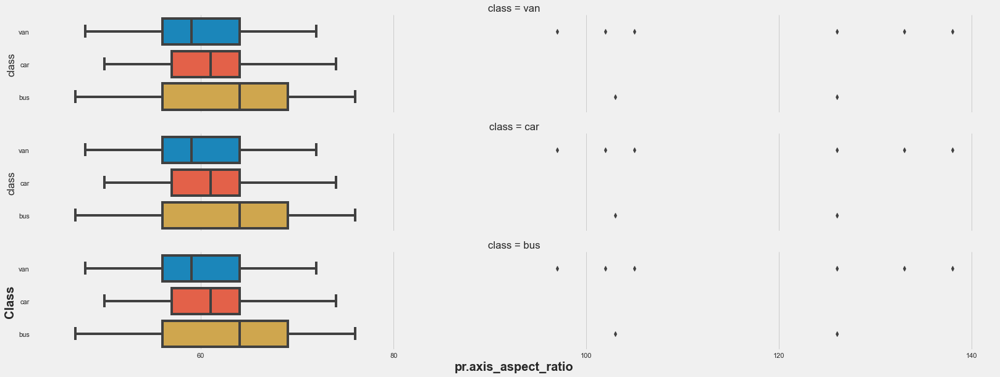

...

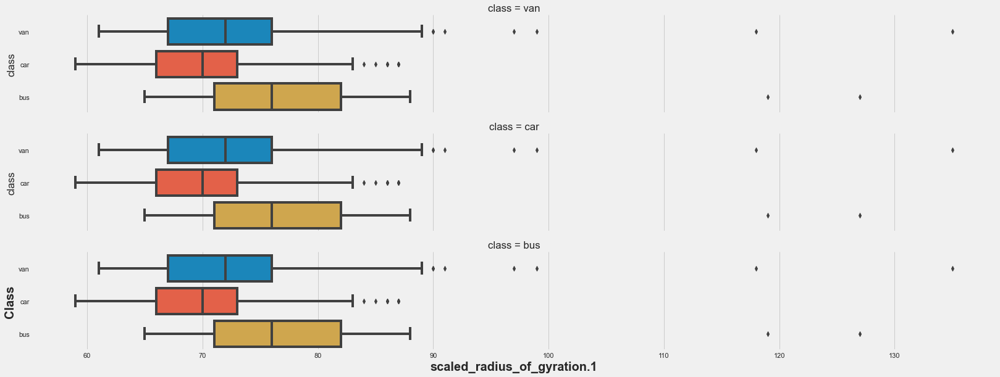

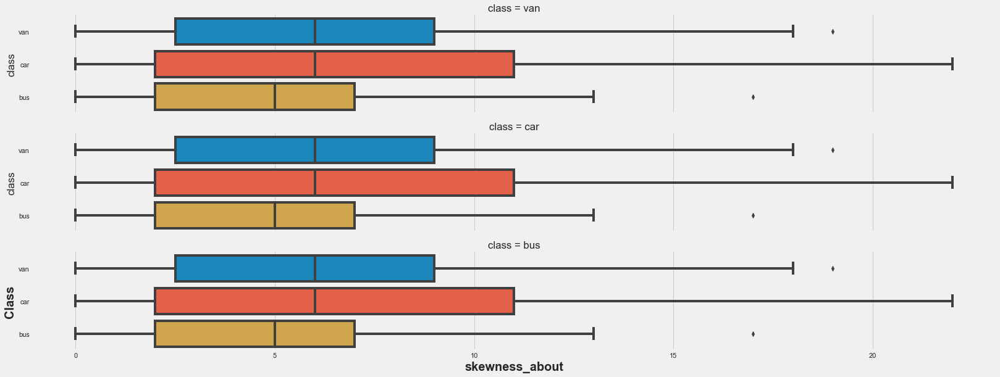

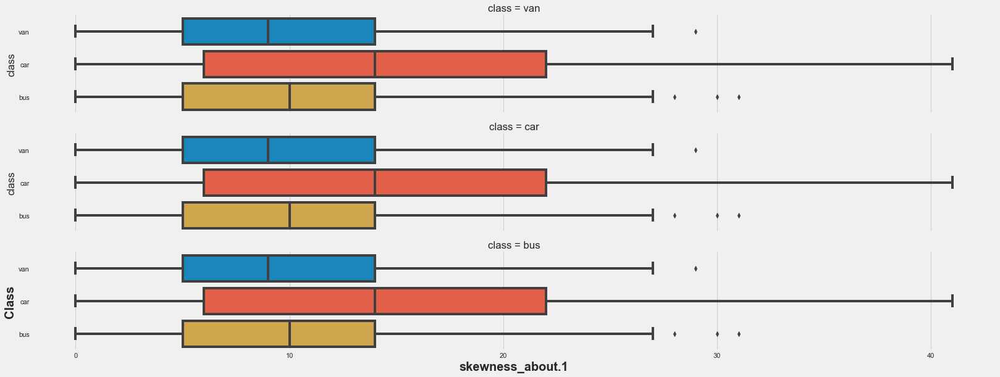

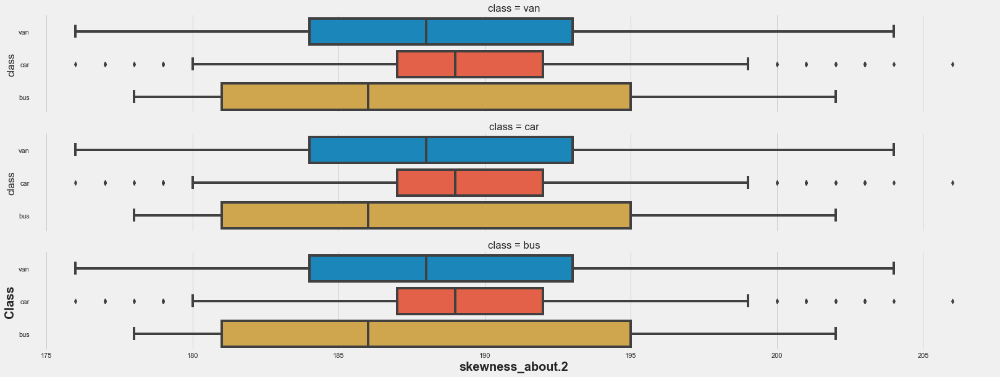

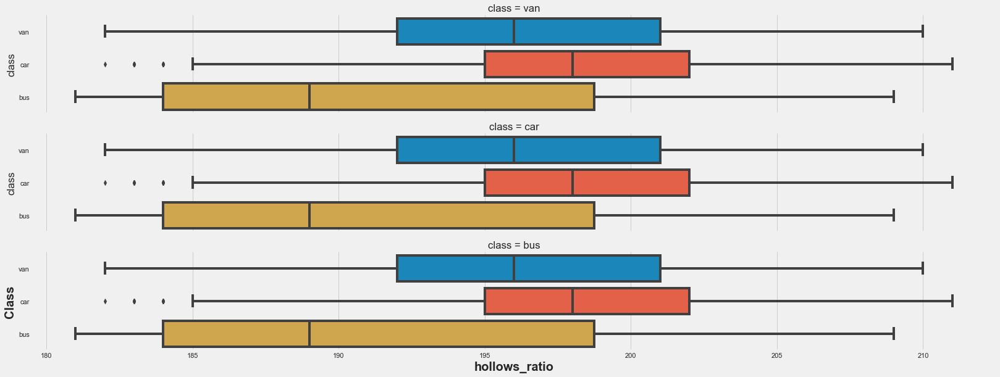

In [139]:
for i in num_cols:
        sns.catplot(x = data[i], y = data['class'], row = 'class', kind = 'box', orient = 'h', height = 2.8, aspect = 8, 
            data = data)
        plt.xlabel(i,fontsize=20,fontweight='bold')
        plt.ylabel('Class',fontsize=20,fontweight='bold')
        plt.show()

In [140]:
for i in num_cols:
    print(i, "Total no/: of unique datas: ",data[i].nunique())

compactness Total no/: of unique datas:  44
circularity Total no/: of unique datas:  27
distance_circularity Total no/: of unique datas:  63
radius_ratio Total no/: of unique datas:  134
pr.axis_aspect_ratio Total no/: of unique datas:  37
max.length_aspect_ratio Total no/: of unique datas:  21
scatter_ratio Total no/: of unique datas:  131
elongatedness Total no/: of unique datas:  35
pr.axis_rectangularity Total no/: of unique datas:  13
max.length_rectangularity Total no/: of unique datas:  66
scaled_variance Total no/: of unique datas:  128
scaled_variance.1 Total no/: of unique datas:  423
scaled_radius_of_gyration Total no/: of unique datas:  144
scaled_radius_of_gyration.1 Total no/: of unique datas:  40
skewness_about Total no/: of unique datas:  23
skewness_about.1 Total no/: of unique datas:  41
skewness_about.2 Total no/: of unique datas:  30
hollows_ratio Total no/: of unique datas:  31


In [141]:
for i in num_cols:
    q25=data[i].quantile(0.25)
    q75=data[i].quantile(0.75)
    IQR=q75-q25
    Threshold=1.5*IQR
    lower,upper=q25-Threshold,q75+Threshold
    Outliers= [a for a in  data[i]  if a<lower or a> upper]
    print(i,"  :",len(Outliers))

compactness   : 0
circularity   : 0
distance_circularity   : 0
radius_ratio   : 3
pr.axis_aspect_ratio   : 8
max.length_aspect_ratio   : 13
scatter_ratio   : 0
elongatedness   : 0
pr.axis_rectangularity   : 0
max.length_rectangularity   : 0
scaled_variance   : 1
scaled_variance.1   : 2
scaled_radius_of_gyration   : 0
scaled_radius_of_gyration.1   : 15
skewness_about   : 12
skewness_about.1   : 1
skewness_about.2   : 0
hollows_ratio   : 0


In [142]:
for i in num_cols:
    q25=data[i].quantile(0.25)
    q75=data[i].quantile(0.75)
    IQR=q75-q25
    Threshold=1.5*IQR
    lower,upper=q25-Threshold,q75+Threshold
    Outliers= [a for a in  data[i]  if a<lower or a> upper]
    Median=data[i].median()
    data[i]=np.where(data[i]>upper,Median,data[i])
    data[i]=np.where(data[i]<lower,Median,data[i])
    Outliers= [a for a in  data[i]  if a<lower or a> upper]
    print('Total outliers in {} after handling: '.format(i),len(Outliers))

Total outliers in compactness after handling:  0
Total outliers in circularity after handling:  0
Total outliers in distance_circularity after handling:  0
Total outliers in radius_ratio after handling:  0
Total outliers in pr.axis_aspect_ratio after handling:  0
Total outliers in max.length_aspect_ratio after handling:  0
Total outliers in scatter_ratio after handling:  0
Total outliers in elongatedness after handling:  0
Total outliers in pr.axis_rectangularity after handling:  0
Total outliers in max.length_rectangularity after handling:  0
Total outliers in scaled_variance after handling:  0
Total outliers in scaled_variance.1 after handling:  0
Total outliers in scaled_radius_of_gyration after handling:  0
Total outliers in scaled_radius_of_gyration.1 after handling:  0
Total outliers in skewness_about after handling:  0
Total outliers in skewness_about.1 after handling:  0
Total outliers in skewness_about.2 after handling:  0
Total outliers in hollows_ratio after handling:  0


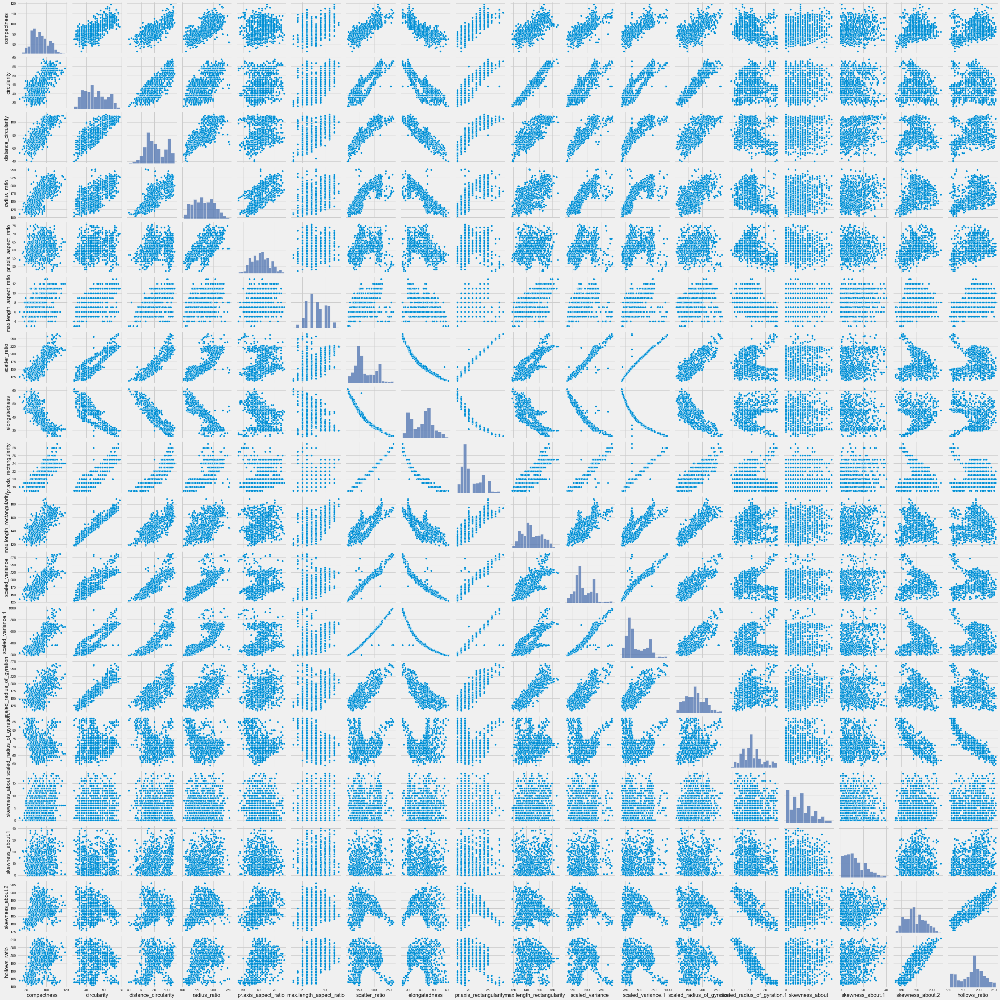

In [143]:
sns.pairplot(data=data)

### Data Preprocessing

In [145]:
Data=data.copy()

In [146]:
data['class']=label.fit_transform(data['class'])

In [147]:
data.iloc[:,:-1]=data.iloc[:,:-1].apply(zscore)

In [148]:
x=data.iloc[:,:-1]
y=data[['class']]

In [149]:
kfold=StratifiedKFold(n_splits=10)
for train,test in kfold.split(x,y):
    X_train,X_test=x.iloc[train],x.iloc[test]
    Y_train,Y_test=y.iloc[train],y.iloc[test]
    sm=SMOTE()
    X_train_sm,Y_train_sm=sm.fit_resample(X_train,Y_train)

In [150]:
svc=SVC()
params={'C': [0.1, 1,10], 
              'gamma': [1, 0.1, 0.01,],
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid',]} 

cv=KFold(n_splits=4)
svc_hyper=GridSearchCV(svc,params,cv=cv,scoring="roc_auc")
svc_hyper.fit(X_train_sm,Y_train_sm)
print("Best params: ",svc_hyper.best_params_)

Best params:  {'C': 0.1, 'gamma': 1, 'kernel': 'linear'}


In [151]:
sv=svm.SVC(C= 0.1, gamma= 1, kernel= 'linear',probability=True)
sv.fit(X_train_sm,Y_train_sm)
yhat=sv.predict(X_test)
print(metrics.classification_report(Y_test,yhat))

              precision    recall  f1-score   support

           0       0.83      0.86      0.84        22
           1       0.93      0.88      0.90        43
           2       0.95      1.00      0.97        19

    accuracy                           0.90        84
   macro avg       0.90      0.92      0.91        84
weighted avg       0.91      0.90      0.90        84



In [152]:
print('Train: ',sv.score(X_train_sm,Y_train_sm))
print('Test: ',sv.score(X_test,Y_test))

Train:  0.9404145077720207
Test:  0.9047619047619048


In [153]:
len(data.columns)

19

In [154]:
pca=PCA(n_components=18)
pca.fit(x)

PCA(n_components=18)

In [155]:
print('Eigen values: ',pca.explained_variance_)

Eigen values:  [9.74940269e+00 3.35071912e+00 1.19238155e+00 1.13381916e+00
 8.83997312e-01 6.66265745e-01 3.18150910e-01 2.28179142e-01
 1.31018595e-01 7.98619108e-02 7.33979478e-02 6.46162669e-02
 4.01448646e-02 3.22758478e-02 2.93936408e-02 2.27005257e-02
 1.98136761e-02 5.16287320e-03]


In [156]:
print("Eigen vectors: ",pca.components_)

Eigen vectors:  [[ 2.72502890e-01  2.87254690e-01  3.02421105e-01  2.69713545e-01
   9.78607336e-02  1.95200137e-01  3.10523932e-01 -3.09006904e-01
   3.07287000e-01  2.78154157e-01  2.99765086e-01  3.05532374e-01
   2.63237620e-01 -4.19359352e-02  3.60832115e-02  5.87204797e-02
   3.80131449e-02  8.47399995e-02]
 [-8.70435783e-02  1.31621757e-01 -4.61430061e-02 -1.97931263e-01
  -2.57839952e-01 -1.08045626e-01  7.52853487e-02 -1.32299375e-02
   8.75601978e-02  1.22154240e-01  7.72657535e-02  7.15030171e-02
   2.10582046e-01  5.03621577e-01 -1.57663214e-02 -9.27462386e-02
  -5.01621218e-01 -5.07612106e-01]
 [-3.81852075e-02 -2.01146908e-01  6.34621085e-02  5.62851689e-02
  -6.19927464e-02 -1.48957820e-01  1.09042833e-01 -9.08526930e-02
   1.06070496e-01 -2.13684693e-01  1.44599805e-01  1.10343735e-01
  -2.02870191e-01  7.38640211e-02 -5.59173987e-01  6.70680496e-01
  -6.22407145e-02 -4.17053530e-02]
 [ 1.38675013e-01 -3.80554832e-02  1.08954287e-01 -2.54355087e-01
  -6.12765722e-01  2.

In [157]:
print('% of variance explained: ',pca.explained_variance_ratio_)

% of variance explained:  [5.40993254e-01 1.85931025e-01 6.61651173e-02 6.29154973e-02
 4.90529110e-02 3.69710110e-02 1.76541580e-02 1.26616348e-02
 7.27020705e-03 4.43152841e-03 4.07284383e-03 3.58554935e-03
 2.22763400e-03 1.79098315e-03 1.63104981e-03 1.25964961e-03
 1.09945865e-03 2.86487251e-04]


<BarContainer object of 18 artists>

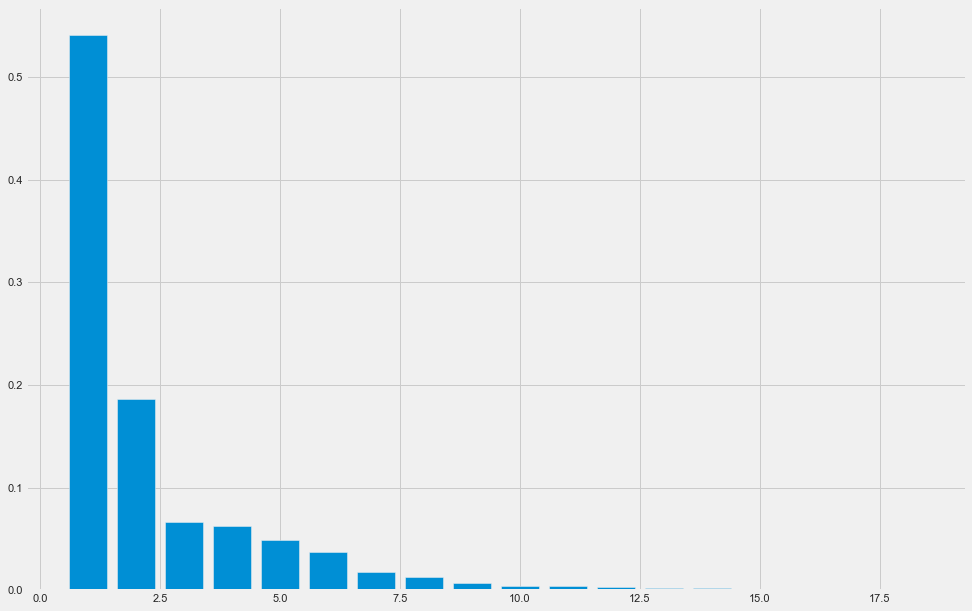

In [158]:
plt.bar(range(1,19),pca.explained_variance_ratio_)

In [159]:
pca=PCA(n_components=8)
pca.fit(x)
new_x=pca.transform(x)

In [160]:
kfold=StratifiedKFold(n_splits=10)
for train,test in kfold.split(new_x,y):
    X_train,X_test=x.iloc[train],x.iloc[test]
    Y_train,Y_test=y.iloc[train],y.iloc[test]
    sm=SMOTE()
    X_train_sm,Y_train_sm=sm.fit_resample(X_train,Y_train)

In [161]:
sv=svm.SVC(C= 0.1, gamma= 1, kernel= 'linear',probability=True)
sv.fit(X_train_sm,Y_train_sm)
yhat=sv.predict(X_test)
print(metrics.classification_report(Y_test,yhat))

              precision    recall  f1-score   support

           0       0.84      0.95      0.89        22
           1       0.97      0.88      0.93        43
           2       0.95      1.00      0.97        19

    accuracy                           0.93        84
   macro avg       0.92      0.95      0.93        84
weighted avg       0.93      0.93      0.93        84



In [162]:
print('Train score: ',sv.score(X_train_sm,Y_train_sm))
print('Test score: ',sv.score(X_test,Y_test))

Train score:  0.9421416234887737
Test score:  0.9285714285714286


#### Part 4

### • DOMAIN: Sports management
• CONTEXT: Company X is a sports management company for international cricket

### • PROJECT OBJECTIVE: Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.
Steps and tasks: [ Total Score: 5 points]
1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden
patterns by using all possible methods.
2. Build a data driven model to rank all the players in the dataset using all or the most important performance features.


In [163]:
data=pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')
data.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [164]:
data.tail()

,Name,Runs,Ave,SR,Fours,Sixes,HF
175,PC Valthaty,30.0,5.0,58.82,4.0,0.0,0.0
176,NaN,NaN,NaN,NaN,NaN,NaN,NaN
177,RP Singh,6.0,3.0,50.00,0.0,0.0,0.0
178,NaN,NaN,NaN,NaN,NaN,NaN,NaN
179,R Sharma,2.0,0.5,18.18,0.0,0.0,0.0


In [165]:
data.sample(5)

,Name,Runs,Ave,SR,Fours,Sixes,HF
87,MK Pandey,143.0,20.42,127.67,12.0,6.0,1.0
157,SP Goswami,69.0,13.80,102.98,4.0,1.0,0.0
82,NaN,NaN,NaN,NaN,NaN,NaN,NaN
74,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [166]:
data.shape

(180, 7)

In [167]:
data.isna().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [168]:
data.dropna(inplace=True)

In [169]:
data.sample(5)

,Name,Runs,Ave,SR,Fours,Sixes,HF
137,Shakib Al Hasan,91.0,15.16,122.97,6.0,3.0,0.0
133,AD Mathews,127.0,18.14,117.59,5.0,4.0,0.0
37,Mandeep Singh,432.0,27.00,126.31,53.0,7.0,2.0
51,SE Marsh,336.0,30.54,120.00,39.0,7.0,2.0
109,Y Nagar,153.0,30.60,115.03,13.0,3.0,0.0


In [170]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Name,90,90,SR Watson,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Runs,90.0,NaN,NaN,NaN,219.933333,156.253669,2.0,98.0,196.5,330.75,733.0
Ave,90.0,NaN,NaN,NaN,24.729889,13.619215,0.5,14.665,24.44,32.195,81.33
SR,90.0,NaN,NaN,NaN,119.164111,23.656547,18.18,108.745,120.135,131.9975,164.1
Fours,90.0,NaN,NaN,NaN,19.788889,16.399845,0.0,6.25,16.0,28.0,73.0
Sixes,90.0,NaN,NaN,NaN,7.577778,8.001373,0.0,3.0,6.0,10.0,59.0
HF,90.0,NaN,NaN,NaN,1.188889,1.688656,0.0,0.0,0.5,2.0,9.0


In [171]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 1 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 5.6+ KB


#### EDA

<AxesSubplot:>

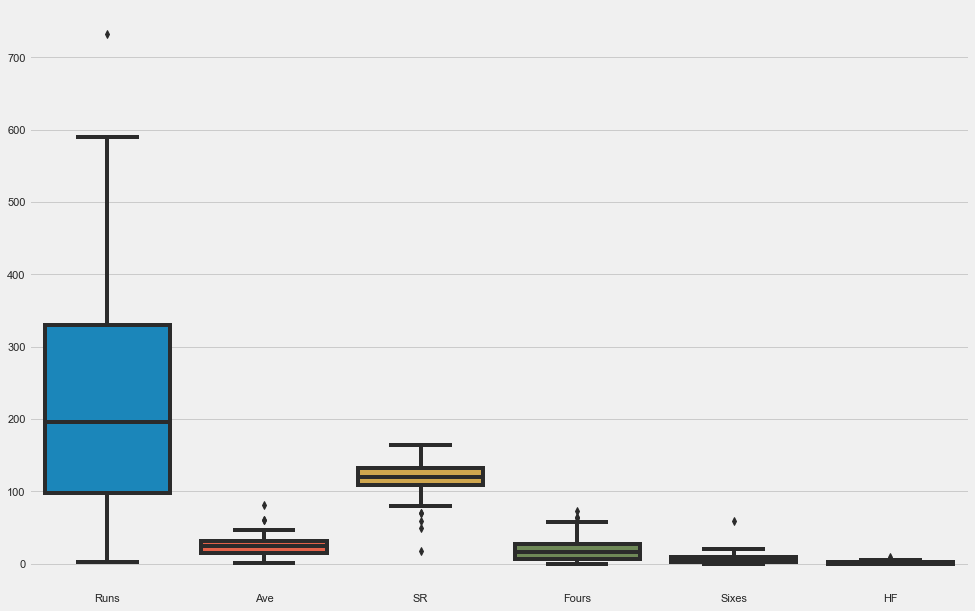

In [172]:
sns.boxplot(data=data)

In [173]:
data.iplot()

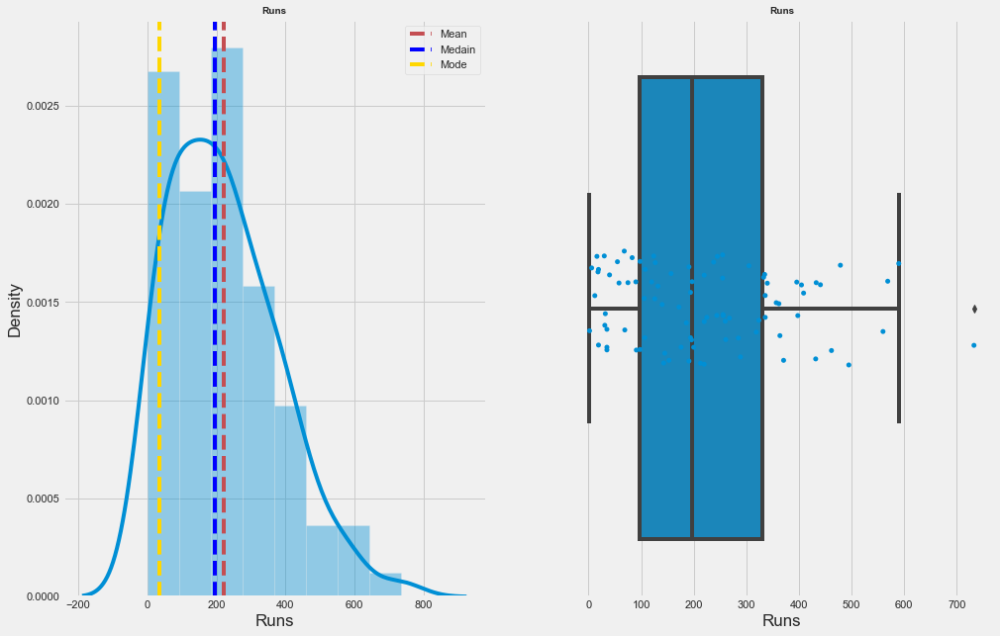

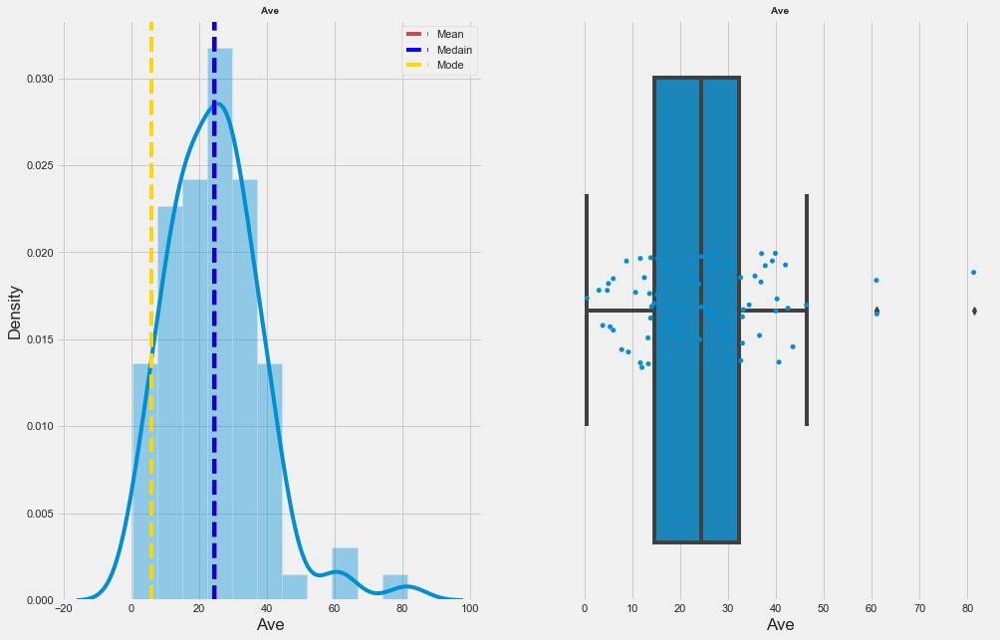

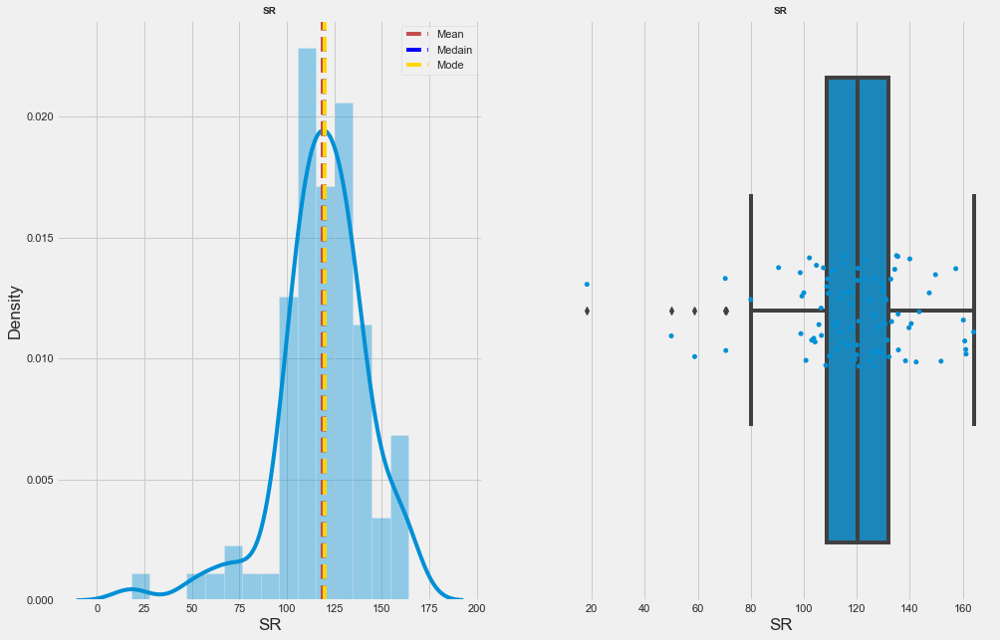

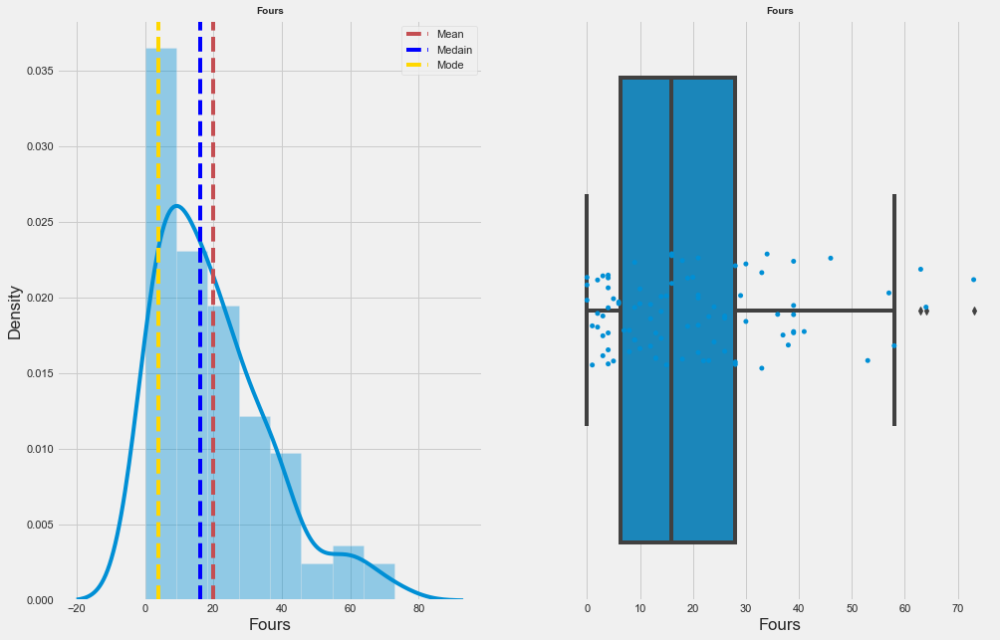

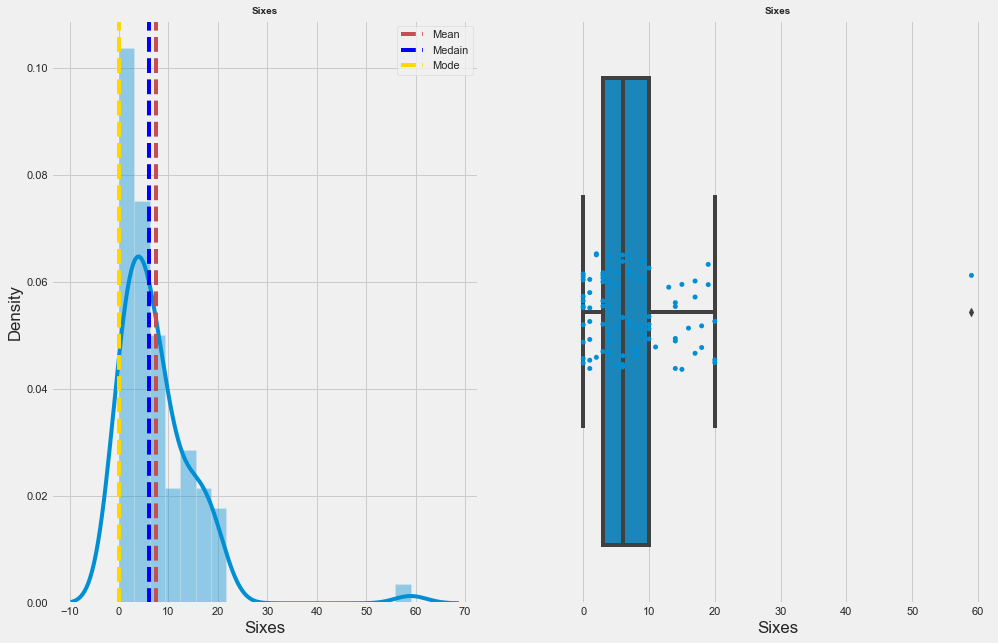

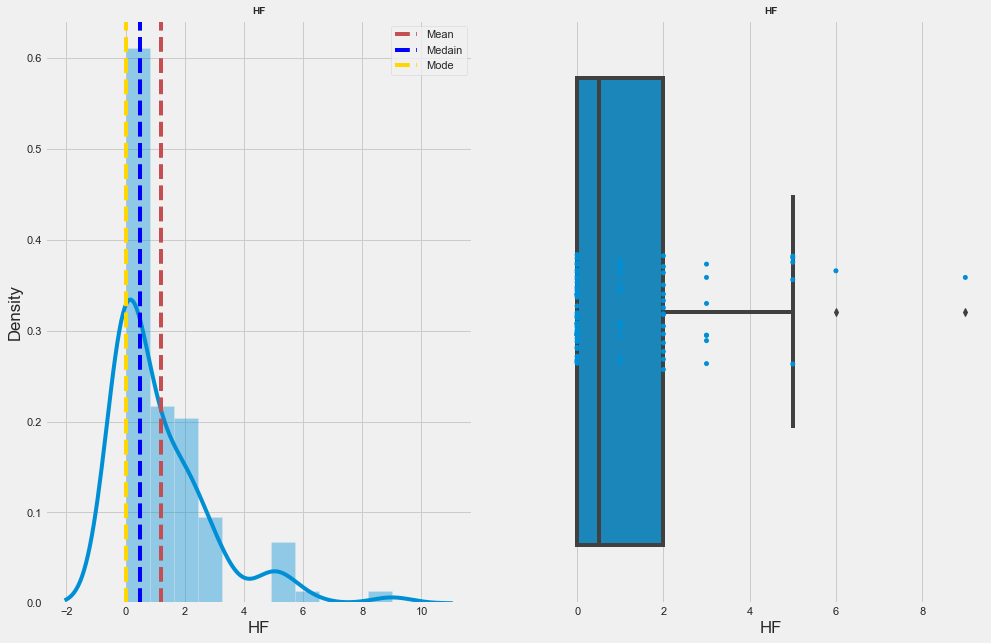

In [174]:
num_cols=data.select_dtypes(exclude='object').columns
for i in num_cols:
    fig,ax=plt.subplots(1,2, figsize=(15,10))
    sns.distplot(data[i],ax=ax[0]).set_title(i,fontsize=10,fontweight='bold')
    sns.boxplot(data[i],ax=ax[1]).set_title(i,fontsize=10,fontweight='bold')
    sns.stripplot(data[i],ax=ax[1]).set_title(i,fontsize=10,fontweight='bold')
    ax[0].axvline(data[i].mean(),linestyle='--',color='r',label='Mean')
    ax[0].axvline(data[i].median(),linestyle='--',color='blue',label='Medain')
    ax[0].axvline(data[i].mode()[0],linestyle='--',color='gold',label='Mode')
    ax[0].legend()
    plt.show()

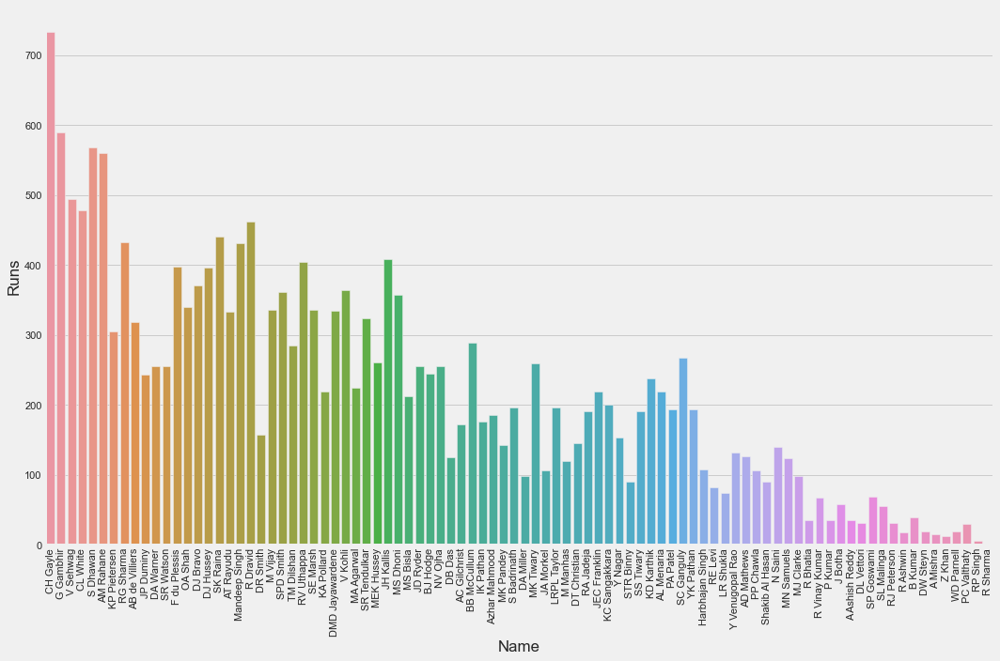

In [175]:
sns.barplot(data=data,x=data['Name'],y=data['Runs'])
plt.xticks(rotation=90)
plt.tight_layout()

In [176]:
fig = px.bar(data, y='Runs', x='Name',template="plotly_dark")
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig

In [177]:
fig = px.line_3d(data, x='Name', y='Ave', z='SR', color='HF')
fig

In [178]:
px.scatter(data, x="Ave", y="Sixes",color='HF',
                 size='Runs', hover_data=['SR'])

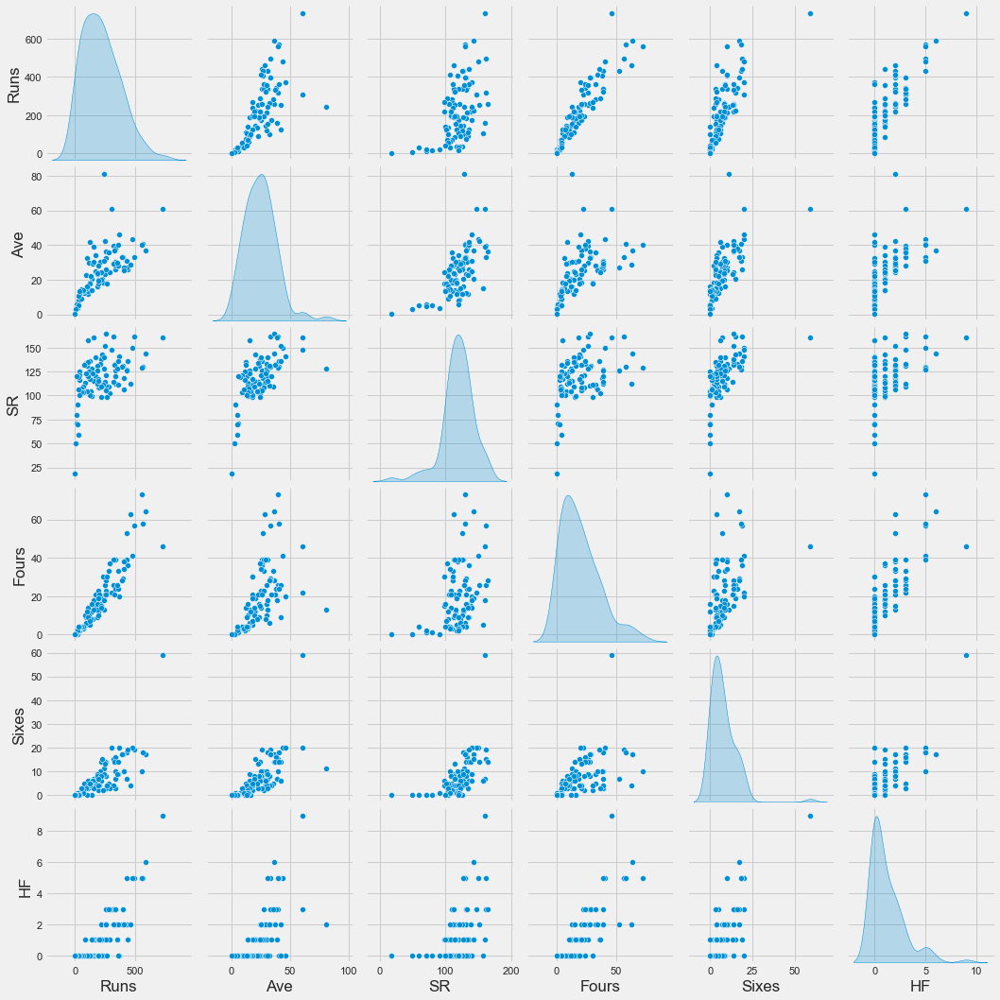

In [179]:
sns.pairplot(data=data,diag_kind='kde')

<AxesSubplot:>

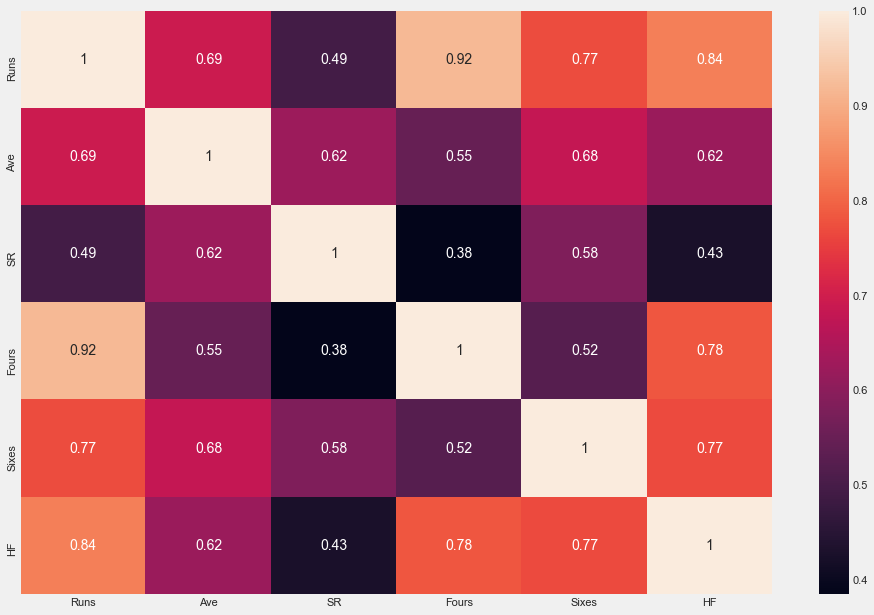

In [180]:
sns.heatmap(data.corr(),annot=True)

In [181]:
new_data=data.copy()

In [182]:
X=new_data.iloc[:,1:]

In [183]:
x=X.apply(zscore)
x.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
3,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
5,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
7,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
9,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


<BarContainer object of 6 artists>

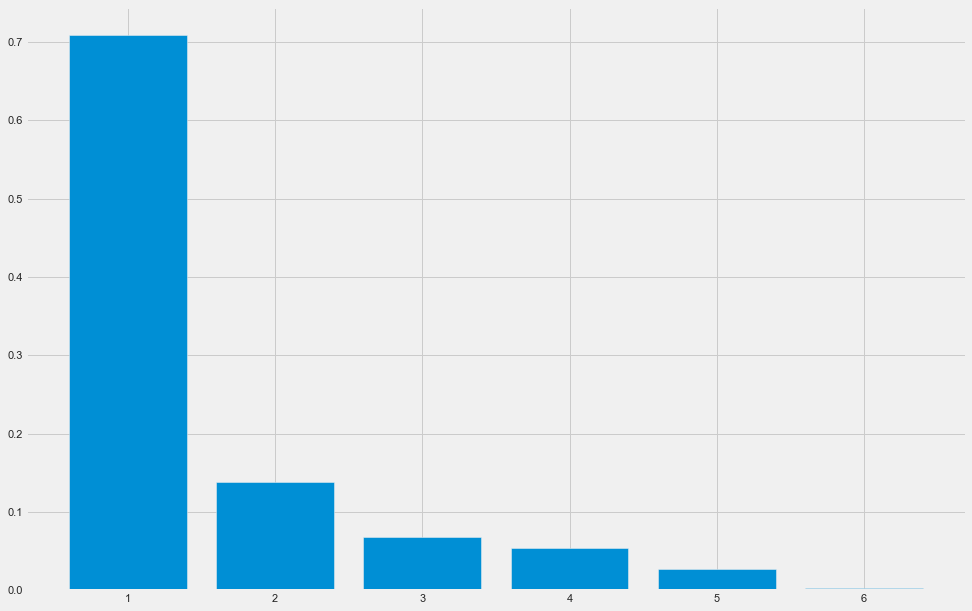

In [184]:
pca=PCA(n_components=6)
pca.fit(x)
plt.bar(range(1,7),pca.explained_variance_ratio_)

In [185]:
performance=np.dot(x,pca.explained_variance_)
data['Preformance']=performance

In [186]:
data.sort_values('Preformance',ascending=False,inplace=True)

In [187]:
data['Rank']=data['Preformance'].rank(ascending=False,method='dense')

In [188]:
data.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF,Preformance,Rank
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,18.866934,1.0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,12.565995,2.0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,11.860002,3.0
11,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,11.702451,4.0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,9.899828,5.0


### Part 5

In [189]:
from sklearn.datasets import load_digits
digits = load_digits()
digits.images.shape

(1797, 8, 8)

In [190]:
Y=digits.target
Y

array([0, 1, 2, ..., 8, 9, 8])

In [191]:
X=digits.data
X

array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., 10.,  0.,  0.],
       [ 0.,  0.,  0., ..., 16.,  9.,  0.],
       ...,
       [ 0.,  0.,  1., ...,  6.,  0.,  0.],
       [ 0.,  0.,  2., ..., 12.,  0.,  0.],
       [ 0.,  0., 10., ..., 12.,  1.,  0.]])

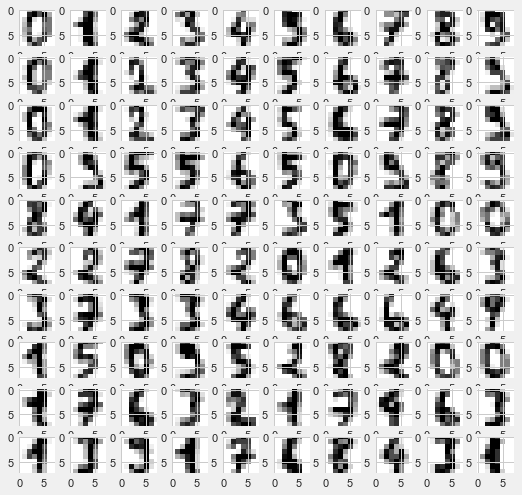

In [192]:
fig, axes = plt.subplots(10, 10, figsize=(8, 8))
for i,ax in enumerate(axes.flat):
    ax.imshow(digits.images[i], cmap='binary', interpolation='nearest')

In [193]:
score=[]
for i in range(2,10):
    pca=PCA(n_components=i)
    pca.fit(X)
    score.append(pca.explained_variance_ratio_)
score

[array([0.14890594, 0.13618771]),
 array([0.14890594, 0.13618771, 0.11794594]),
 array([0.14890594, 0.13618771, 0.11794594, 0.08409979]),
 array([0.14890594, 0.13618771, 0.11794594, 0.08409979, 0.05782415]),
 array([0.14890594, 0.13618771, 0.11794594, 0.08409979, 0.05782415,
        0.0491691 ]),
 array([0.14890594, 0.13618771, 0.11794594, 0.08409979, 0.05782398,
        0.04916901, 0.04315981]),
 array([0.14890594, 0.13618771, 0.11794594, 0.08409979, 0.05782414,
        0.04916895, 0.04315964, 0.03661345]),
 array([0.14890594, 0.13618771, 0.11794594, 0.08409979, 0.05782415,
        0.0491691 , 0.04315986, 0.03661368, 0.03353211])]

In [194]:
pca=PCA(n_components=2)
pca.fit(X)
new_x=pca.transform(X)

In [195]:
svm=SVC()
svm.fit(X,Y)
print('Scores before reducing the dimentions :',svm.score(X,Y))

Scores before reducing the dimentions : 0.996661101836394


In [196]:
svm=SVC()
svm.fit(new_x,Y)
print('Scores after reducing the dimentions :',svm.score(new_x,Y))

Scores after reducing the dimentions : 0.6633277685030606
